# Imports

In [1]:
import pandas as pd
import seaborn as sb
from sklearn.preprocessing import OneHotEncoder
from mlxtend.feature_selection import SequentialFeatureSelector as SFS
from sklearn.tree import DecisionTreeClassifier
from sklearn.neighbors import KNeighborsClassifier
from sklearn.ensemble import RandomForestClassifier
from sklearn.naive_bayes import GaussianNB, MultinomialNB
from sklearn.linear_model import LogisticRegression, LinearRegression
from sklearn.svm import SVC
from sklearn.neural_network import MLPClassifier
from xgboost import XGBClassifier
from sklearn.ensemble import BaggingClassifier



from sklearn.preprocessing import StandardScaler, MinMaxScaler

from sklearn.model_selection import train_test_split
from sklearn.metrics import accuracy_score, precision_score, recall_score, f1_score
import sklearn.tree as tree
import matplotlib.pyplot as plt
import numpy as np

from my_utils import split_and_train, split_and_train_conferences_together, train_evaluate_decision_tree_graph_old
from my_utils import train_evaluate_decision_tree_graph_old, train_evaluate_decision_tree_average, train_evaluate_decision_tree_years_back
from my_utils import plot_metrics_over_time, plot_metrics_over_time_test_train, plot_metrics_over_time_three


In [2]:
df_teams=pd.read_csv('data_merged.csv')

# Feature selection

## Agregation and manual selection

In [3]:
df_teams['performance'] = (df_teams['points'] + df_teams['rebounds'] +
                            df_teams['assists'] + df_teams['steals'] +
                            df_teams['blocks']) - (df_teams['turnovers'] +
                            df_teams['PF'])
df_teams['Postperformance'] = (df_teams['PostPoints'] + df_teams['PostRebounds'] +
                            df_teams['PostAssists'] + df_teams['PostSteals'] +
                            df_teams['PostBlocks']) - (df_teams['PostTurnovers'] +
                            df_teams['PostPF'])
                            
df_teams.drop(columns=['points', 'rebounds', 'assists', 'steals', 'blocks', 'turnovers', 'PF', 'PostPoints', 'PostRebounds', 'PostAssists', 'PostSteals', 'PostBlocks', 'PostTurnovers', 'PostPF'], inplace=True)

In basketball, one can calculate the total points scored using the following formula:
Total Points = Free Throws Made (ftMade) + 2 * (Field Goals Made (fgMade) - Three-Pointers Made (threeMade)) + 3 * Three-Pointers Made (threeMade).
However, it's important to note that the given dataset already includes a dedicated column for total points. Consequently, the columns for Free Throws Made (ftMade), Field Goals Made (fgMade), and Three-Pointers Made (threeMade)  end up giving redundant information, and therefore, are not useful and can be deleted from the dataset.

In [4]:
points_made = 1 * df_teams['ftMade'] + 2 * (df_teams['fgMade'] - df_teams['threeMade']) + 3 * df_teams['threeMade']
points_attempted = 1 * df_teams['ftAttempted'] + 2 * (df_teams['fgAttempted'] - df_teams['threeAttempted']) + 3 * df_teams['threeAttempted']
df_teams['points_precision'] = points_attempted - points_made

post_points_made = 1 * df_teams['PostftMade'] + 2 * (df_teams['PostfgMade'] - df_teams['PostthreeMade']) + 3 * df_teams['PostthreeMade']
post_points_attempted = 1 * df_teams['PostftAttempted'] + 2 * (df_teams['PostfgAttempted'] - df_teams['PostthreeAttempted']) + 3 * df_teams['PostthreeAttempted']
df_teams['Postpoints_precision'] = post_points_attempted - post_points_made

df_teams.drop(columns=['ftMade', 'fgMade', 'threeMade', 'fgAttempted', 'ftAttempted', 'threeAttempted', 'PostftMade', 'PostfgMade', 'PostthreeMade', 'PostfgAttempted', 'PostftAttempted', 'PostthreeAttempted'], inplace=True)

The "won" and "lost" collumns is the sum of  "homeW","awayW", "homeL","awayL"


In [5]:
df_teams.drop(columns=["homeW","homeL","awayW","awayL"], inplace=True)

The rebound and postRebound are the sum of the offensive and defensive rebound. We can delete the offensive and defensive rebound columns.

In [6]:
df_teams.drop(columns=["oRebounds", "dRebounds", "PostoRebounds", "PostdRebounds"], inplace=True)

In [7]:
df_teams.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 142 entries, 0 to 141
Data columns (total 39 columns):
 #   Column                   Non-Null Count  Dtype  
---  ------                   --------------  -----  
 0   year                     142 non-null    int64  
 1   tmID                     142 non-null    object 
 2   rank                     142 non-null    float64
 3   playoff                  142 non-null    int64  
 4   confW                    142 non-null    float64
 5   confL                    142 non-null    float64
 6   min                      142 non-null    float64
 7   attend                   142 non-null    float64
 8   num_playoff_appearances  142 non-null    float64
 9   total_first_round_won    142 non-null    float64
 10  total_first_round_lost   142 non-null    float64
 11  total_semis_won          142 non-null    float64
 12  total_semis_lost         142 non-null    float64
 13  total_finals_won         142 non-null    float64
 14  total_finals_lost        1

Feature aggregationFrom the players we get the following statistics taht are repeated one for the normal season and one for the playoffs. To eliminate the redundancy we will sum the two columns and then delete the columns that are not needed.

## Function for bi-directional feature selection for each algorithm

In [8]:
def backwards_elimination(df, model, scaling=False):
    scaler=MinMaxScaler()
    if(scaling):
        X = scaler.fit_transform(df.drop(columns=['playoff']))
        X = pd.DataFrame(X, columns=df.drop(columns=['playoff']).columns)
    else:
        X = df.drop(columns=['playoff'])
    Y = df['playoff']
    ffs = SFS(model, k_features=(3, 32), forward=False, n_jobs=-1, cv=0)
    ffs.fit(X, Y)
    features = list(ffs.k_feature_names_)
    teams_collumns_array=['tmID_ATL','tmID_CHA','tmID_CHI','tmID_CLE','tmID_CON','tmID_DET','tmID_HOU','tmID_IND','tmID_LAS','tmID_MIA','tmID_MIN','tmID_NYL','tmID_ORL','tmID_PHO','tmID_POR','tmID_SAC','tmID_SAS','tmID_SEA','tmID_UTA','tmID_WAS']

    #if it does not have the 'playoff', 'year', 'tmID', 'confID_EA', 'confID_WE' add it
    if 'playoff' not in features:
        features.append('playoff')
    if 'year' not in features:
        features.append('year')
    if 'confID_EA' not in features:
        features.append('confID_EA')
    if 'confID_WE' not in features:
        features.append('confID_WE')
    for team in teams_collumns_array:
        if team not in features:
            features.append(team)
    return features


In [9]:
from sklearn.feature_selection import SelectKBest, f_classif, mutual_info_classif
def select_k_best(df, model, scaling=False):
    X=df.drop(['playoff'], axis=1)
    Y=df['playoff']
    hightest_accuracy_score = 0
    hightest_selected_column_names = []
    accuracy_scores = []
    teams_collumns_array=['tmID_ATL','tmID_CHA','tmID_CHI','tmID_CLE','tmID_CON','tmID_DET','tmID_HOU','tmID_IND','tmID_LAS','tmID_MIA','tmID_MIN','tmID_NYL','tmID_ORL','tmID_PHO','tmID_POR','tmID_SAC','tmID_SAS','tmID_SEA','tmID_UTA','tmID_WAS']
    for i in range(5, df.shape[1]):
        fs = SelectKBest(score_func=f_classif, k=i)
        # apply feature selection
        fs.fit_transform(X, Y)
        selected_feature_indices = fs.get_support()
        # Get the column names of the selected features
        selected_column_names = X.columns[selected_feature_indices]
        if 'playoff' not in selected_column_names:
            selected_column_names=selected_column_names.append(pd.Index(['playoff']))
        if 'year' not in selected_column_names:
            selected_column_names=selected_column_names.append(pd.Index(['year']))
        if 'confID_EA' not in selected_column_names:
            selected_column_names=selected_column_names.append(pd.Index(['confID_EA']))
        if 'confID_WE' not in selected_column_names:
            selected_column_names=selected_column_names.append(pd.Index(['confID_WE']))
        for team in teams_collumns_array:
            if team not in selected_column_names:
                selected_column_names=selected_column_names.append(pd.Index([team]))
        accuracy_score, precision_score, recall_score, f1_score = train_evaluate_decision_tree_average(model, df[selected_column_names], scaling=scaling)
        accuracy_scores.append(accuracy_score)

        if(accuracy_score > hightest_accuracy_score):
            hightest_accuracy_score = accuracy_score
            hightest_selected_column_names = selected_column_names
    print("hightest_accuracy_score: ", hightest_accuracy_score)
        # Plotting the results
    plt.plot(range(5, df.shape[1]), accuracy_scores, marker='o')
    plt.title('Number of Features vs. Accuracy Score')
    plt.xlabel('Number of Features (K)')
    plt.ylabel('Accuracy Score')
    plt.show()
    return hightest_selected_column_names
    

# Train and test

## Functions

In [10]:
def split_data(df):
    # Filter the rows based on the 'confID_EA' and 'confID_EW' values
    confEA_data = df[df['confID_EA'] == 1]
    confEW_data = df[df['confID_WE'] == 1]

    return confEA_data, confEW_data
    

In [11]:
df_teams = df_teams[df_teams['year'] != 1]
df_teams = df_teams[df_teams['year'] != 2]

#one hot encoding sklearn to encode column tmID
encoder = OneHotEncoder()
onehotarray = encoder.fit_transform(df_teams[['tmID']]).toarray()
items = [f'tmID_{item}' for item in encoder.categories_[0]]
df_teams[items] = onehotarray
df_teams=df_teams.drop(['tmID'], axis=1)



df_teams.head()


,year,rank,playoff,confW,confL,min,attend,num_playoff_appearances,total_first_round_won,total_first_round_lost,...,tmID_MIN,tmID_NYL,tmID_ORL,tmID_PHO,tmID_POR,tmID_SAC,tmID_SAS,tmID_SEA,tmID_UTA,tmID_WAS
32,3,6.0,1,10.0,11.0,6487.5,98244.0,1.0,1.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
33,3,1.5,0,14.0,7.0,6462.5,142452.5,2.0,1.0,1.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
34,3,6.0,0,8.5,12.5,6487.5,108318.5,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
35,3,3.0,1,15.0,6.0,6462.5,188596.0,2.0,1.0,1.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
36,3,6.5,1,7.0,14.0,6450.0,159596.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0


No need to sample the data, as it is balanced.

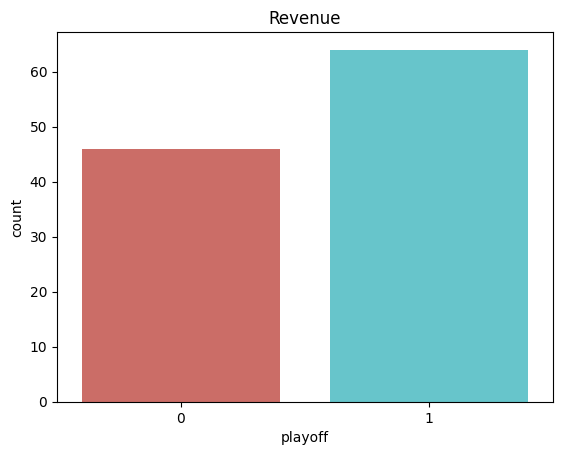

In [12]:
sb.countplot(x='playoff',data=df_teams, palette='hls')
plt.title("Revenue")
plt.show()

## Models

### Desicion Tree

#### Hyperparameter tuning

In [13]:
from  sklearn.model_selection import GridSearchCV

# model = DecisionTreeClassifier()
# param_grid = {'max_depth': [2, 3, 4, 5, 6, 7, 8, None],
#                 'min_samples_split': [2, 3, 4, 6],
#                 'min_samples_leaf': [1, 2, 3, 4, 5 ],
#                 'criterion': ['gini', 'entropy', 'log_loss'],
#                 'max_features': [None, 'sqrt', 'log2'],
#                 'splitter': ['best', 'random'],
                
#               }
# grid = GridSearchCV(model, param_grid, cv=None)
# X = df_teams.drop(columns=['playoff'])
# y = df_teams['playoff']
# grid.fit(X, y)
# print(grid.best_estimator_)
# DecisionTreeClassifier(criterion='entropy', min_samples_leaf=4, min_samples_split=4, splitter='random')


In [14]:
# model = DecisionTreeClassifier()

# features = backwards_elimination(df_teams,model)
# print(features)
# features_kbest = select_k_best(df_teams, model)
# print(features_kbest)

# years_tested, accuracy_scores, precision_scores, recall_scores, f1_scores = train_evaluate_decision_tree_graph_old(model, df_teams, title="Normal Training")
# years_tested, bidirectional_accuracy_scores, bidirectional_precision_scores, bidirectional_recall_scores, bidirectional_f1_scores = train_evaluate_decision_tree_graph_old(model, df_teams[features], title="Bidirectional Selection")
# years_tested, kbest_accuracy_scores, kbest_precision_scores, kbest_recall_scores, kbest_f1_scores = train_evaluate_decision_tree_graph_old(model, df_teams[features_kbest], title="KBest Selection")
# train_evaluate_decision_tree_years_back(model, df_teams)
# plot_metrics_over_time_three(years_tested, accuracy_scores, precision_scores, recall_scores, f1_scores, bidirectional_accuracy_scores, bidirectional_precision_scores, bidirectional_recall_scores, bidirectional_f1_scores, kbest_accuracy_scores, kbest_precision_scores, kbest_recall_scores, kbest_f1_scores)

### Random Forest

#### Hyperparameter tuning

In [15]:
from sklearn.model_selection import RandomizedSearchCV

# model = RandomForestClassifier()

# param_grid = {'max_depth': [4, 6, 10, 100, 200, None],
#                 'min_samples_split': [2, 3, 4, 6],
#                 'min_samples_leaf': [1, 2, 3, 4 ],
#                 'max_features': [None, 'sqrt', 'log2'],
#                 'max_leaf_nodes': [None,  6, 7, 10, 20],
#                 'min_impurity_decrease': [0, 0.1, 0.2],
#                 'bootstrap': [False, True],
#                 'class_weight': ['balanced', 'balanced_subsample', None],
#                 'n_jobs': [None, 2, 3],                
#               }
# grid = RandomizedSearchCV(model, param_grid, cv=None)
# X = df_teams.drop(columns=['playoff'])
# y = df_teams['playoff']
# grid.fit(X, y)
# print(grid.best_estimator_, grid.best_score_)


In [16]:
# RandomForestClassifier(bootstrap=False, max_depth=200, max_features='log2', min_impurity_decrease=0.2, n_jobs=2) 0.8975384615384616
# RandomForestClassifier(bootstrap=False, max_depth=200, max_features='log2',
                    #    max_leaf_nodes=6, min_impurity_decrease=0.2,
                    #    min_samples_split=6, n_jobs=3)


In [17]:
# model = RandomForestClassifier()

# features = backwards_elimination(df_teams, model)
# print(features)
# features_kbest = select_k_best(df_teams, model)
# print(features_kbest)
# years_tested, accuracy_scores, precision_scores, recall_scores, f1_scores = train_evaluate_decision_tree_graph_old(model, df_teams, title="Normal Training")
# years_tested, bidirectional_accuracy_scores, bidirectional_precision_scores, bidirectional_recall_scores, bidirectional_f1_scores = train_evaluate_decision_tree_graph_old(model, df_teams[features], title="Bidirectional Selection")
# years_tested, kbest_accuracy_scores, kbest_precision_scores, kbest_recall_scores, kbest_f1_scores = train_evaluate_decision_tree_graph_old(model, df_teams[features_kbest], title="KBest Selection")
# train_evaluate_decision_tree_years_back(model, df_teams)
# plot_metrics_over_time_three(years_tested, accuracy_scores, precision_scores, recall_scores, f1_scores, bidirectional_accuracy_scores, bidirectional_precision_scores, bidirectional_recall_scores, bidirectional_f1_scores, kbest_accuracy_scores, kbest_precision_scores, kbest_recall_scores, kbest_f1_scores)

### KNN

#### Hyperparameter tuning

In [18]:

# model = KNeighborsClassifier()

# param_grid = {'n_neighbors': [2, 3, 4, 5, 6, 7, 8, 9, 10],
#               'weights': ['uniform', 'distance'],
#               'algorithm': ['auto', 'ball_tree', 'kd_tree', 'brute'],
#               'leaf_size': [5, 10, 20, 30, 40, 50],
#               'p': [1, 2, 3],
#               'metric': ['minkowski', 'euclidean', 'manhattan']          
#               }
# grid = GridSearchCV(model, param_grid)
# scaler=MinMaxScaler()
# X = scaler.fit_transform(df_teams.drop(columns=['playoff']))
# X = pd.DataFrame(X, columns=df_teams.drop(columns=['playoff']).columns)
# y = df_teams['playoff']
# grid.fit(X, y)
# print(grid.best_estimator_, grid.best_score_)




['year', 'rank', 'min', 'num_playoff_appearances', 'total_first_round_lost', 'total_semis_won', 'total_finals_lost', 'mean_won', 'confID_EA', 'GP', 'PostGS', 'weight', 'won', 'post_losses', 'tmID_CHA', 'tmID_CHI', 'tmID_SEA', 'tmID_WAS', 'playoff', 'confID_WE', 'tmID_ATL', 'tmID_CLE', 'tmID_CON', 'tmID_DET', 'tmID_HOU', 'tmID_IND', 'tmID_LAS', 'tmID_MIA', 'tmID_MIN', 'tmID_NYL', 'tmID_ORL', 'tmID_PHO', 'tmID_POR', 'tmID_SAC', 'tmID_SAS', 'tmID_UTA']
hightest_accuracy_score:  0.6996336996336997


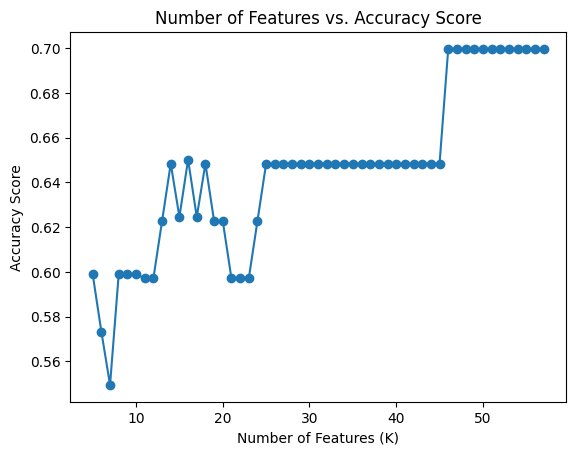

Index(['rank', 'confW', 'confL', 'min', 'attend', 'num_playoff_appearances',
       'total_first_round_won', 'total_first_round_lost', 'total_semis_won',
       'total_semis_lost', 'total_finals_won', 'total_finals_lost', 'mean_won',
       'mean_lost', 'GP', 'GS', 'minutes', 'dq', 'PostGP', 'PostGS',
       'PostMinutes', 'PostDQ', 'award_count_x', 'won', 'lost', 'post_wins',
       'post_losses', 'performance', 'Postperformance', 'points_precision',
       'Postpoints_precision', 'tmID_CHA', 'tmID_CHI', 'tmID_CON', 'tmID_DET',
       'tmID_IND', 'tmID_LAS', 'tmID_MIA', 'tmID_MIN', 'tmID_ORL', 'tmID_PHO',
       'tmID_POR', 'tmID_SAC', 'tmID_SAS', 'tmID_SEA', 'tmID_UTA', 'playoff',
       'year', 'confID_EA', 'confID_WE', 'tmID_ATL', 'tmID_CLE', 'tmID_HOU',
       'tmID_NYL', 'tmID_WAS'],
      dtype='object')


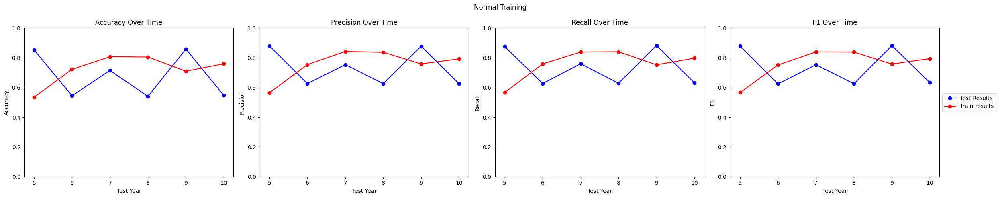

Normal Training
Accuracy: 0.67, Precision: 0.73, Recall: 0.73, F1: 0.73
10 year
Accuracy: 0.5384615384615384, Precision: 0.625, Recall: 0.625, F1: 0.625


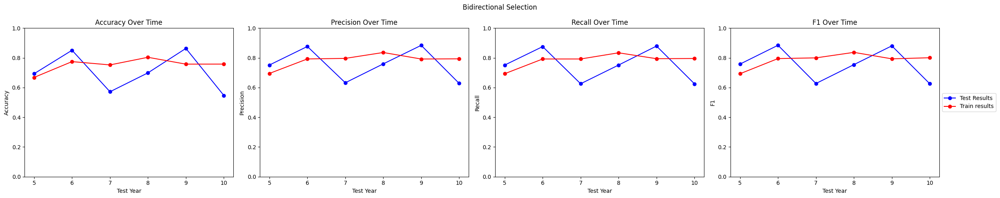

Bidirectional Selection
Accuracy: 0.70, Precision: 0.75, Recall: 0.75, F1: 0.75
10 year
Accuracy: 0.5384615384615384, Precision: 0.625, Recall: 0.625, F1: 0.625


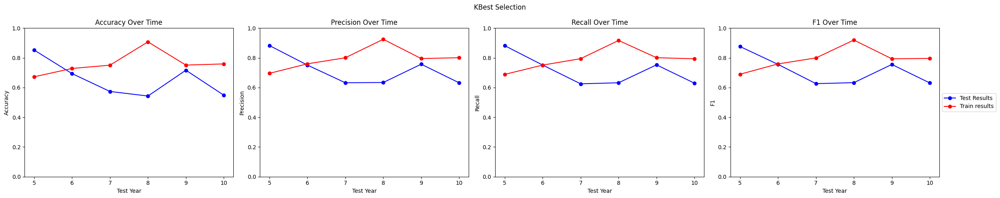

KBest Selection
Accuracy: 0.65, Precision: 0.71, Recall: 0.71, F1: 0.71
10 year
Accuracy: 0.5384615384615384, Precision: 0.625, Recall: 0.625, F1: 0.625


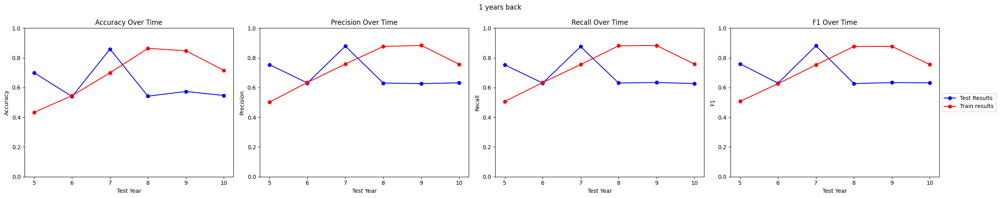

1 years back
Accuracy: 0.62, Precision: 0.69, Recall: 0.69, F1: 0.69
10 year
Accuracy: 0.5384615384615384, Precision: 0.625, Recall: 0.625, F1: 0.625


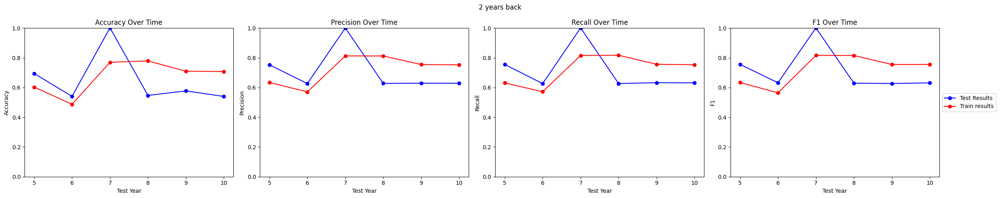

2 years back
Accuracy: 0.65, Precision: 0.71, Recall: 0.71, F1: 0.71
10 year
Accuracy: 0.5384615384615384, Precision: 0.625, Recall: 0.625, F1: 0.625


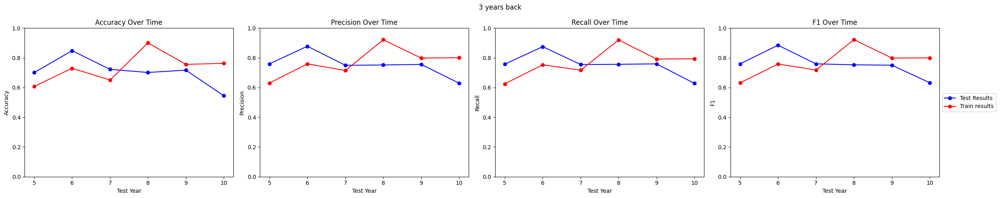

3 years back
Accuracy: 0.70, Precision: 0.75, Recall: 0.75, F1: 0.75
10 year
Accuracy: 0.5384615384615384, Precision: 0.625, Recall: 0.625, F1: 0.625


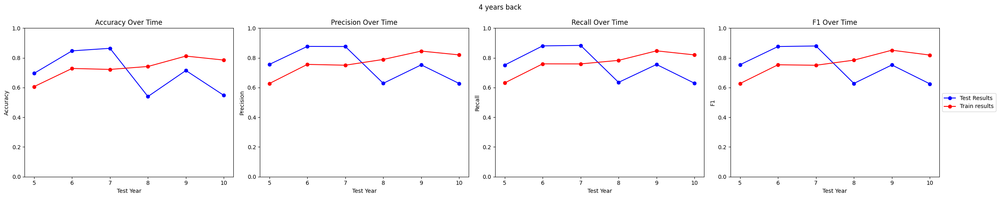

4 years back
Accuracy: 0.70, Precision: 0.75, Recall: 0.75, F1: 0.75
10 year
Accuracy: 0.5384615384615384, Precision: 0.625, Recall: 0.625, F1: 0.625


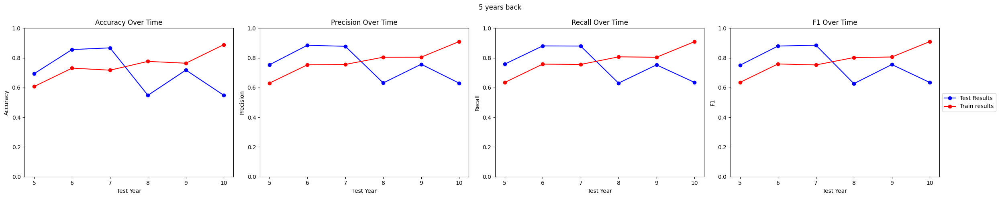

5 years back
Accuracy: 0.70, Precision: 0.75, Recall: 0.75, F1: 0.75
10 year
Accuracy: 0.5384615384615384, Precision: 0.625, Recall: 0.625, F1: 0.625


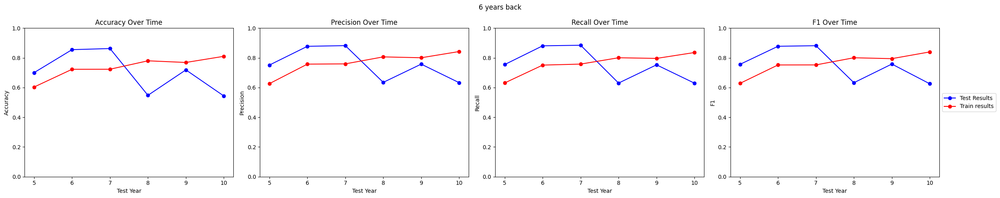

6 years back
Accuracy: 0.70, Precision: 0.75, Recall: 0.75, F1: 0.75
10 year
Accuracy: 0.5384615384615384, Precision: 0.625, Recall: 0.625, F1: 0.625


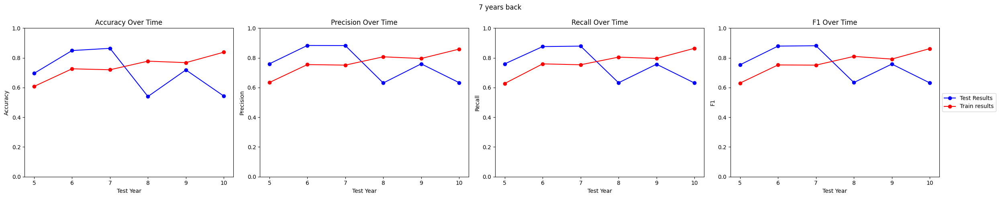

7 years back
Accuracy: 0.70, Precision: 0.75, Recall: 0.75, F1: 0.75
10 year
Accuracy: 0.5384615384615384, Precision: 0.625, Recall: 0.625, F1: 0.625


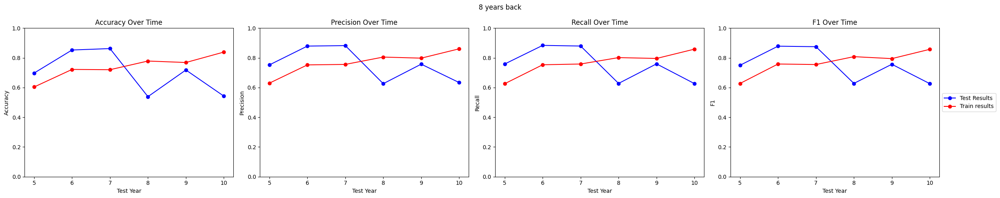

8 years back
Accuracy: 0.70, Precision: 0.75, Recall: 0.75, F1: 0.75
10 year
Accuracy: 0.5384615384615384, Precision: 0.625, Recall: 0.625, F1: 0.625


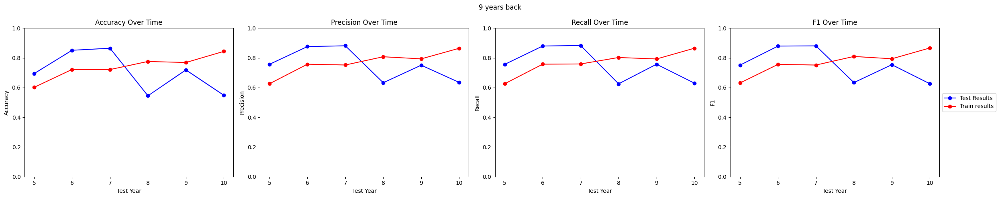

9 years back
Accuracy: 0.70, Precision: 0.75, Recall: 0.75, F1: 0.75
10 year
Accuracy: 0.5384615384615384, Precision: 0.625, Recall: 0.625, F1: 0.625


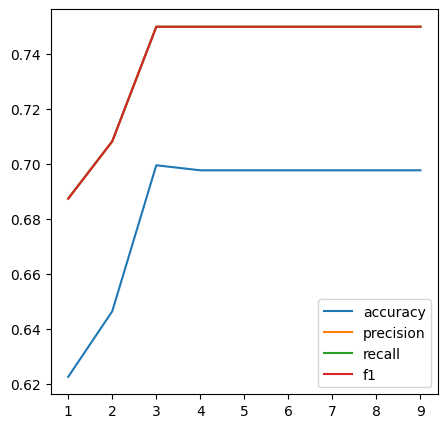

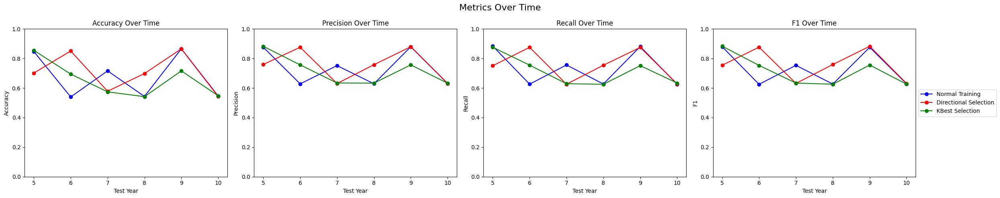

Normal Training
Accuracy: 0.67, Precision: 0.73, Recall: 0.73, F1: 0.73
10 year
Accuracy: 0.5384615384615384, Precision: 0.625, Recall: 0.625, F1: 0.625
Directional Selection
Accuracy: 0.70, Precision: 0.75, Recall: 0.75, F1: 0.75
10 year
Accuracy: 0.5384615384615384, Precision: 0.625, Recall: 0.625, F1: 0.625
KBest Selection
Accuracy: 0.65, Precision: 0.71, Recall: 0.71, F1: 0.71
10 year
Accuracy: 0.5384615384615384, Precision: 0.625, Recall: 0.625, F1: 0.625


In [35]:
model = KNeighborsClassifier()

features = backwards_elimination(df_teams,model, scaling=True)
print(features)
features_kbest = select_k_best(df_teams, model, scaling=True)
print(features_kbest)
#model = BaggingClassifier(estimator=KNeighborsClassifier(leaf_size=5, n_neighbors=10), n_estimators=100, random_state=0)
years_tested, accuracy_scores, precision_scores, recall_scores, f1_scores = train_evaluate_decision_tree_graph_old(model, df_teams, scaling=True, title="Normal Training")
years_tested, bidirectional_accuracy_scores, bidirectional_precision_scores, bidirectional_recall_scores, bidirectional_f1_scores = train_evaluate_decision_tree_graph_old(model, df_teams[features], scaling=True, title="Bidirectional Selection")
years_tested, kbest_accuracy_scores, kbest_precision_scores, kbest_recall_scores, kbest_f1_scores = train_evaluate_decision_tree_graph_old(model, df_teams[features_kbest], scaling=True, title="KBest Selection")
train_evaluate_decision_tree_years_back(model, df_teams, scaling=True)
plot_metrics_over_time_three(years_tested, accuracy_scores, precision_scores, recall_scores, f1_scores, bidirectional_accuracy_scores, bidirectional_precision_scores, bidirectional_recall_scores, bidirectional_f1_scores, kbest_accuracy_scores, kbest_precision_scores, kbest_recall_scores, kbest_f1_scores)

### XGBoost

#### Hyperparameter tuning

In [20]:

# model = XGBClassifier()

# param_grid = {'min_child_weight': [1, 5, 10],
#               'gamma': [0.5, 1, 1.5, 2, 5],
#               'subsample': [0.6, 0.8, 1.0],
#               'colsample_bytree': [0.6, 0.8, 1.0],
#               'max_depth': [3, 4, 5],
#               'n_estimators': [100, 200, 300],
#               'learning_rate': [0.01, 0.1, 0.2],     
#               }
# grid = RandomizedSearchCV(model, param_grid, cv=None)

# X = df_teams.drop(columns=['playoff'])
# y = df_teams['playoff']
# grid.fit(X, y)
# print(grid.best_estimator_, grid.best_score_)
# #XGBClassifier(colsample_bytree=1.0, gamma=5, learning_rate=0.01,max_depth=3, min_child_weight=10,  n_estimators=100) 0.8898461538461537


In [21]:
# features = backwards_elimination(df_teams, XGBClassifier())
# print(features)
# features_kbest = select_k_best(df_teams, XGBClassifier())
# print(features_kbest)
# model = XGBClassifier()
# years_tested, accuracy_scores, precision_scores, recall_scores, f1_scores = train_evaluate_decision_tree_graph_old(model, df_teams, title="Normal Training")
# years_tested, bidirectional_accuracy_scores, bidirectional_precision_scores, bidirectional_recall_scores, bidirectional_f1_scores = train_evaluate_decision_tree_graph_old(model, df_teams[features], title="Bidirectional Selection")
# years_tested, kbest_accuracy_scores, kbest_precision_scores, kbest_recall_scores, kbest_f1_scores = train_evaluate_decision_tree_graph_old(model, df_teams[features_kbest], title="KBest Selection")
# train_evaluate_decision_tree_years_back(model, df_teams)
# plot_metrics_over_time_three(years_tested, accuracy_scores, precision_scores, recall_scores, f1_scores, bidirectional_accuracy_scores, bidirectional_precision_scores, bidirectional_recall_scores, bidirectional_f1_scores, kbest_accuracy_scores, kbest_precision_scores, kbest_recall_scores, kbest_f1_scores)


### Naive bayes

#### Hyperparameter tuning

In [22]:

# model = GaussianNB()

# param_grid = {'var_smoothing': [1e-09, 1e-08, 1e-07, 1e-06, 1e-05],
#               'priors': [None, [0.5, 0.5], [0.6, 0.4], [0.4, 0.6], [0.7, 0.3], [0.3, 0.7], [0.8, 0.2], [0.2, 0.8], [0.9, 0.1], [0.1, 0.9]]
#                   }

              
# grid = GridSearchCV(model, param_grid, cv=None)
# X = df_teams.drop(columns=['playoff'])
#X = pd.DataFrame(X, columns=df_teams.drop(columns=['playoff']).columns)
# y = df_teams['playoff']
# grid.fit(X, y)
# print(grid.best_estimator_, grid.best_score_)




['year', 'confW', 'min', 'attend', 'num_playoff_appearances', 'total_first_round_won', 'total_first_round_lost', 'total_semis_won', 'total_semis_lost', 'total_finals_won', 'total_finals_lost', 'mean_won', 'mean_lost', 'confID_EA', 'confID_WE', 'minutes', 'dq', 'PostGP', 'PostGS', 'PostMinutes', 'PostDQ', 'height', 'weight', 'won', 'lost', 'post_wins', 'post_losses', 'award_count_y', 'performance', 'playoff', 'tmID_ATL', 'tmID_CHA', 'tmID_CHI', 'tmID_CLE', 'tmID_CON', 'tmID_DET', 'tmID_HOU', 'tmID_IND', 'tmID_LAS', 'tmID_MIA', 'tmID_MIN', 'tmID_NYL', 'tmID_ORL', 'tmID_PHO', 'tmID_POR', 'tmID_SAC', 'tmID_SAS', 'tmID_SEA', 'tmID_UTA', 'tmID_WAS']
hightest_accuracy_score:  0.7967032967032966


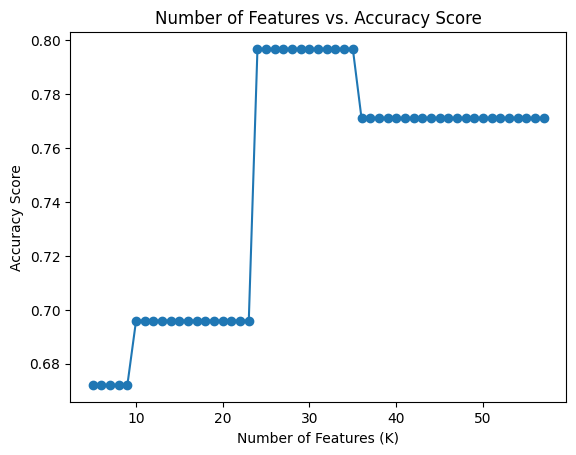

Index(['rank', 'confW', 'attend', 'num_playoff_appearances',
       'total_first_round_won', 'total_semis_won', 'total_finals_won',
       'total_finals_lost', 'mean_won', 'GP', 'GS', 'minutes', 'PostGP',
       'PostGS', 'PostMinutes', 'award_count_x', 'won', 'post_wins',
       'post_losses', 'performance', 'Postperformance', 'points_precision',
       'Postpoints_precision', 'tmID_CHI', 'playoff', 'year', 'confID_EA',
       'confID_WE', 'tmID_ATL', 'tmID_CHA', 'tmID_CLE', 'tmID_CON', 'tmID_DET',
       'tmID_HOU', 'tmID_IND', 'tmID_LAS', 'tmID_MIA', 'tmID_MIN', 'tmID_NYL',
       'tmID_ORL', 'tmID_PHO', 'tmID_POR', 'tmID_SAC', 'tmID_SAS', 'tmID_SEA',
       'tmID_UTA', 'tmID_WAS'],
      dtype='object')


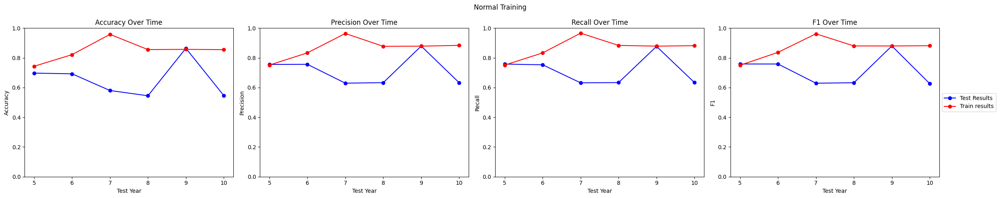

Normal Training
Accuracy: 0.65, Precision: 0.71, Recall: 0.71, F1: 0.71
10 year
Accuracy: 0.5384615384615384, Precision: 0.625, Recall: 0.625, F1: 0.625


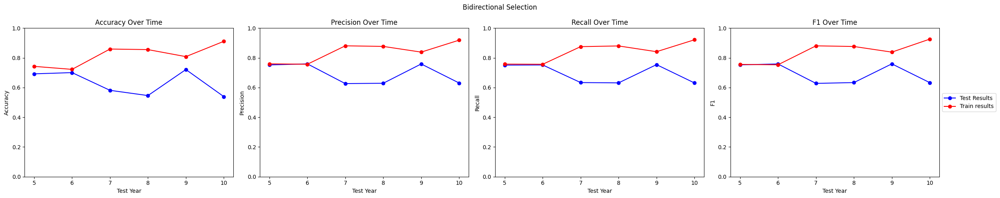

Bidirectional Selection
Accuracy: 0.62, Precision: 0.69, Recall: 0.69, F1: 0.69
10 year
Accuracy: 0.5384615384615384, Precision: 0.625, Recall: 0.625, F1: 0.625


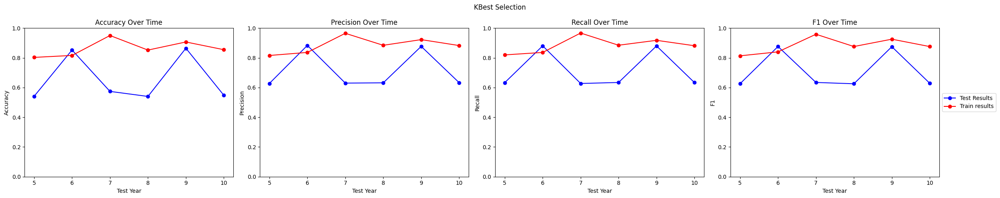

KBest Selection
Accuracy: 0.65, Precision: 0.71, Recall: 0.71, F1: 0.71
10 year
Accuracy: 0.5384615384615384, Precision: 0.625, Recall: 0.625, F1: 0.625


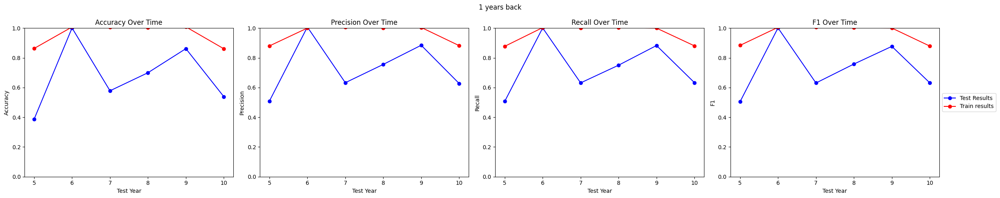

1 years back
Accuracy: 0.67, Precision: 0.73, Recall: 0.73, F1: 0.73
10 year
Accuracy: 0.5384615384615384, Precision: 0.625, Recall: 0.625, F1: 0.625


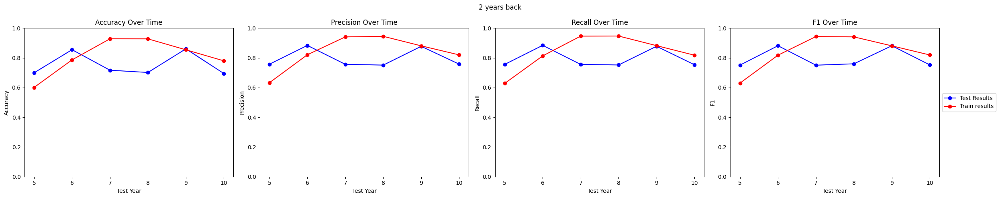

2 years back
Accuracy: 0.75, Precision: 0.79, Recall: 0.79, F1: 0.79
10 year
Accuracy: 0.6923076923076923, Precision: 0.75, Recall: 0.75, F1: 0.75


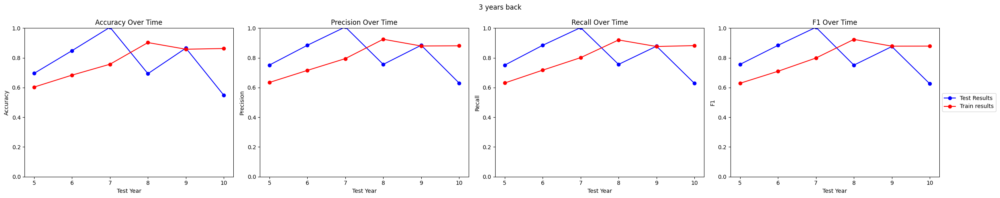

3 years back
Accuracy: 0.77, Precision: 0.81, Recall: 0.81, F1: 0.81
10 year
Accuracy: 0.5384615384615384, Precision: 0.625, Recall: 0.625, F1: 0.625


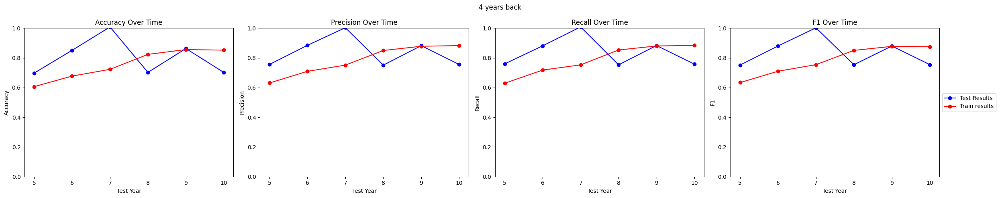

4 years back
Accuracy: 0.80, Precision: 0.83, Recall: 0.83, F1: 0.83
10 year
Accuracy: 0.6923076923076923, Precision: 0.75, Recall: 0.75, F1: 0.75


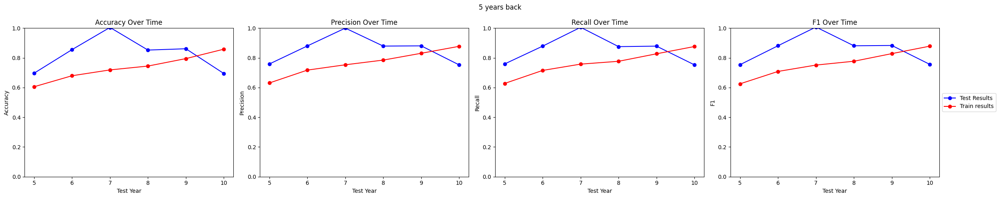

5 years back
Accuracy: 0.82, Precision: 0.85, Recall: 0.85, F1: 0.85
10 year
Accuracy: 0.6923076923076923, Precision: 0.75, Recall: 0.75, F1: 0.75


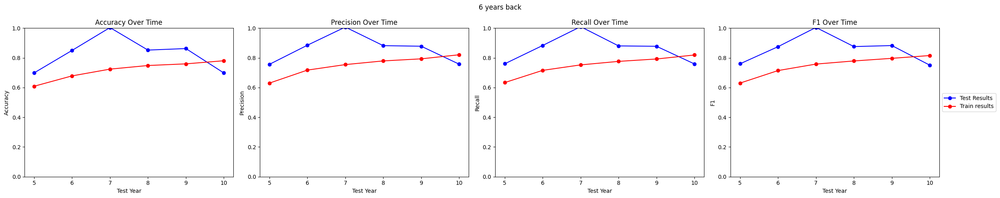

6 years back
Accuracy: 0.82, Precision: 0.85, Recall: 0.85, F1: 0.85
10 year
Accuracy: 0.6923076923076923, Precision: 0.75, Recall: 0.75, F1: 0.75


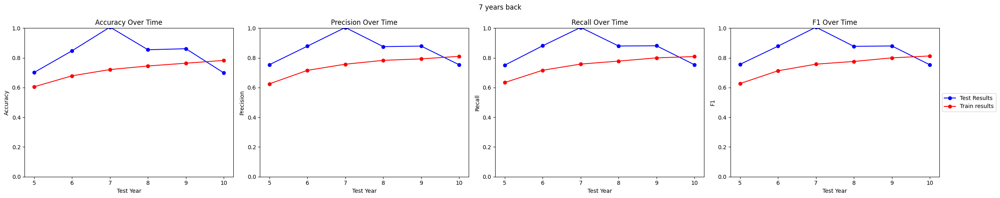

7 years back
Accuracy: 0.82, Precision: 0.85, Recall: 0.85, F1: 0.85
10 year
Accuracy: 0.6923076923076923, Precision: 0.75, Recall: 0.75, F1: 0.75


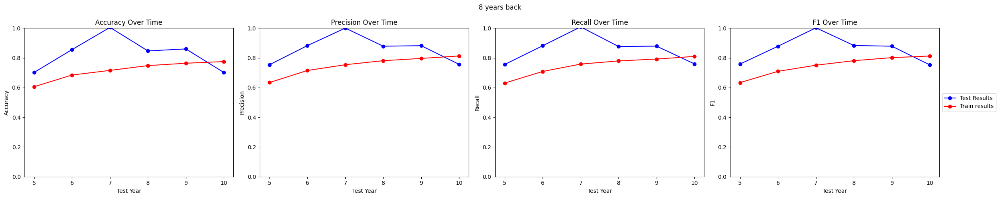

8 years back
Accuracy: 0.82, Precision: 0.85, Recall: 0.85, F1: 0.85
10 year
Accuracy: 0.6923076923076923, Precision: 0.75, Recall: 0.75, F1: 0.75


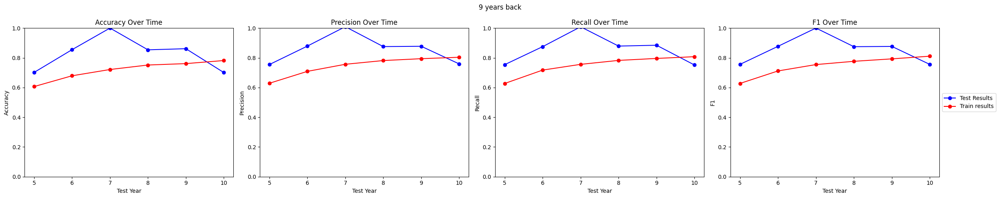

9 years back
Accuracy: 0.82, Precision: 0.85, Recall: 0.85, F1: 0.85
10 year
Accuracy: 0.6923076923076923, Precision: 0.75, Recall: 0.75, F1: 0.75


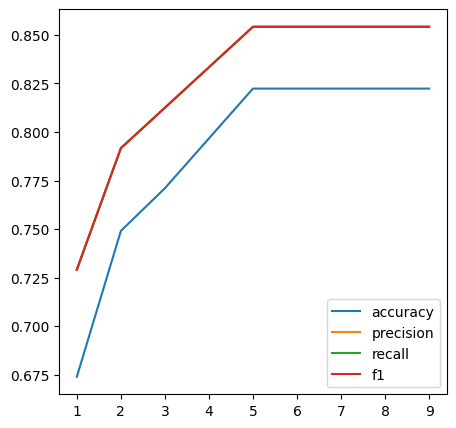

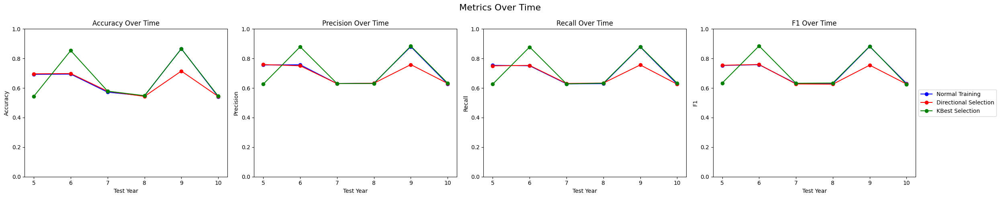

Normal Training
Accuracy: 0.65, Precision: 0.71, Recall: 0.71, F1: 0.71
10 year
Accuracy: 0.5384615384615384, Precision: 0.625, Recall: 0.625, F1: 0.625
Directional Selection
Accuracy: 0.62, Precision: 0.69, Recall: 0.69, F1: 0.69
10 year
Accuracy: 0.5384615384615384, Precision: 0.625, Recall: 0.625, F1: 0.625
KBest Selection
Accuracy: 0.65, Precision: 0.71, Recall: 0.71, F1: 0.71
10 year
Accuracy: 0.5384615384615384, Precision: 0.625, Recall: 0.625, F1: 0.625


In [23]:
features = backwards_elimination(df_teams, GaussianNB())
print(features)
features_kbest = select_k_best(df_teams, GaussianNB())
print(features_kbest)
model = GaussianNB()
years_tested, accuracy_scores, precision_scores, recall_scores, f1_scores = train_evaluate_decision_tree_graph_old(model, df_teams, title="Normal Training")
years_tested, bidirectional_accuracy_scores, bidirectional_precision_scores, bidirectional_recall_scores, bidirectional_f1_scores = train_evaluate_decision_tree_graph_old(model, df_teams[features], title="Bidirectional Selection")
years_tested, kbest_accuracy_scores, kbest_precision_scores, kbest_recall_scores, kbest_f1_scores = train_evaluate_decision_tree_graph_old(model, df_teams[features_kbest], title="KBest Selection")
train_evaluate_decision_tree_years_back(model, df_teams)
plot_metrics_over_time_three(years_tested, accuracy_scores, precision_scores, recall_scores, f1_scores, bidirectional_accuracy_scores, bidirectional_precision_scores, bidirectional_recall_scores, bidirectional_f1_scores, kbest_accuracy_scores, kbest_precision_scores, kbest_recall_scores, kbest_f1_scores)


### SVC

#### Hyperparameter tuning

In [24]:

# model = SVC()
# param_grid = {'C': [0.1, 1, 10, 100, 1000],
#                 'kernel': ['linear', 'poly', 'rbf', 'sigmoid'],
#                 'degree': [1, 2, 3, 4, 5, 6],
#                 'gamma': [1,0.1,0.001,0.0001,'scale', 'auto'],
                    
#               }
# grid = GridSearchCV(model, param_grid, cv=None)
# scaler=MinMaxScaler()
# X = scaler.fit_transform(df_teams.drop(columns=['playoff']))
# X = pd.DataFrame(X, columns=df_teams.drop(columns=['playoff']).columns)
# y = df_teams['playoff']
# grid.fit(X, y)
# print(grid.best_estimator_, grid.best_score_)



In [25]:
# features = backwards_elimination(df_teams, SVC(probability=True), scaling=True )
# print(features)

# features_kbest = select_k_best(df_teams, SVC(probability=True), scaling=True)
# print(features_kbest)
# model = SVC(probability=True)
# years_tested, accuracy_scores, precision_scores, recall_scores, f1_scores = train_evaluate_decision_tree_graph_old(model, df_teams, scaling=True, title="Normal Training")
# years_tested, bidirectional_accuracy_scores, bidirectional_precision_scores, bidirectional_recall_scores, bidirectional_f1_scores = train_evaluate_decision_tree_graph_old(model, df_teams[features], scaling=True, title="Bidirectional Selection")
# years_tested, kbest_accuracy_scores, kbest_precision_scores, kbest_recall_scores, kbest_f1_scores = train_evaluate_decision_tree_graph_old(model, df_teams[features_kbest], scaling=True, title="KBest Selection")
# train_evaluate_decision_tree_years_back(model, df_teams, scaling=True)
# plot_metrics_over_time_three(years_tested, accuracy_scores, precision_scores, recall_scores, f1_scores, bidirectional_accuracy_scores, bidirectional_precision_scores, bidirectional_recall_scores, bidirectional_f1_scores, kbest_accuracy_scores, kbest_precision_scores, kbest_recall_scores, kbest_f1_scores)


### Logistic regression

#### Hyperparameter tuning

In [26]:

# model = LogisticRegression()
# param_grid = {'C': [0.01, 0.1, 1, 10, 100, 1000],
#                 'penalty': ['l1', 'l2', 'elasticnet', 'none'],
#                 'solver': ['lbfgs', 'liblinear', 'sag', 'saga', 'newton-cg'],
#                 'max_iter': [100, 200, 300, 400, 500],
#                 'multi_class': ['auto', 'ovr', 'multinomial'],
#                 'class_weight': ['balanced', None],
                    
#               }
# grid = GridSearchCV(model, param_grid, cv=None)
# scaler=MinMaxScaler()
# X = scaler.fit_transform(df_teams.drop(columns=['playoff']))
# X = pd.DataFrame(X, columns=df_teams.drop(columns=['playoff']).columns)
# y = df_teams['playoff']
# grid.fit(X, y)
# print(grid.best_estimator_, grid.best_score_)

# # LogisticRegression(C=10, class_weight='balanced', penalty='l1', solver='saga') 0.8975384615384616


['year', 'rank', 'confW', 'confL', 'min', 'attend', 'num_playoff_appearances', 'total_first_round_won', 'total_first_round_lost', 'total_semis_won', 'total_semis_lost', 'total_finals_won', 'mean_won', 'mean_lost', 'confID_EA', 'confID_WE', 'GP', 'GS', 'minutes', 'PostGP', 'PostMinutes', 'PostDQ', 'award_count_x', 'lost', 'post_losses', 'award_count_y', 'points_precision', 'tmID_CHA', 'tmID_CHI', 'tmID_DET', 'tmID_MIA', 'tmID_SEA', 'playoff', 'tmID_ATL', 'tmID_CLE', 'tmID_CON', 'tmID_HOU', 'tmID_IND', 'tmID_LAS', 'tmID_MIN', 'tmID_NYL', 'tmID_ORL', 'tmID_PHO', 'tmID_POR', 'tmID_SAC', 'tmID_SAS', 'tmID_UTA', 'tmID_WAS']
hightest_accuracy_score:  0.771062271062271


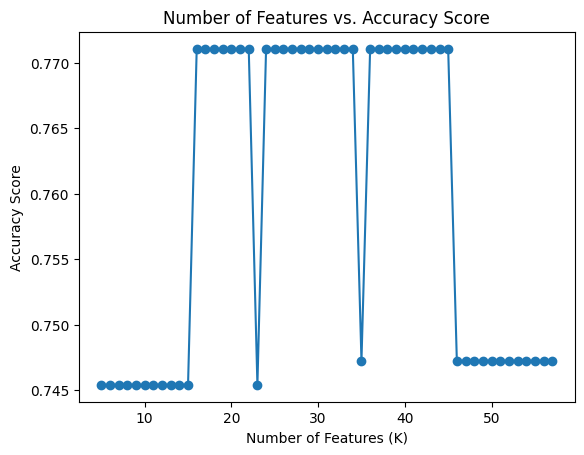

Index(['confW', 'num_playoff_appearances', 'total_first_round_won',
       'total_semis_won', 'total_finals_won', 'mean_won', 'minutes', 'PostGP',
       'PostGS', 'PostMinutes', 'won', 'post_wins', 'performance',
       'Postperformance', 'points_precision', 'Postpoints_precision',
       'playoff', 'year', 'confID_EA', 'confID_WE', 'tmID_ATL', 'tmID_CHA',
       'tmID_CHI', 'tmID_CLE', 'tmID_CON', 'tmID_DET', 'tmID_HOU', 'tmID_IND',
       'tmID_LAS', 'tmID_MIA', 'tmID_MIN', 'tmID_NYL', 'tmID_ORL', 'tmID_PHO',
       'tmID_POR', 'tmID_SAC', 'tmID_SAS', 'tmID_SEA', 'tmID_UTA', 'tmID_WAS'],
      dtype='object')


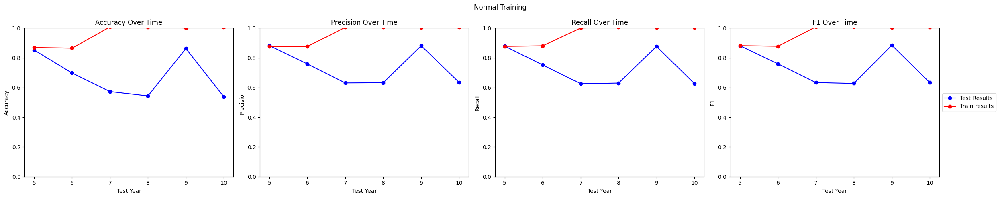

Normal Training
Accuracy: 0.67, Precision: 0.73, Recall: 0.73, F1: 0.73
10 year
Accuracy: 0.5384615384615384, Precision: 0.625, Recall: 0.625, F1: 0.625


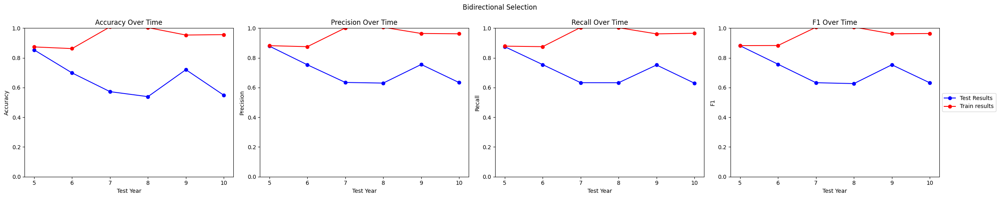

Bidirectional Selection
Accuracy: 0.65, Precision: 0.71, Recall: 0.71, F1: 0.71
10 year
Accuracy: 0.5384615384615384, Precision: 0.625, Recall: 0.625, F1: 0.625


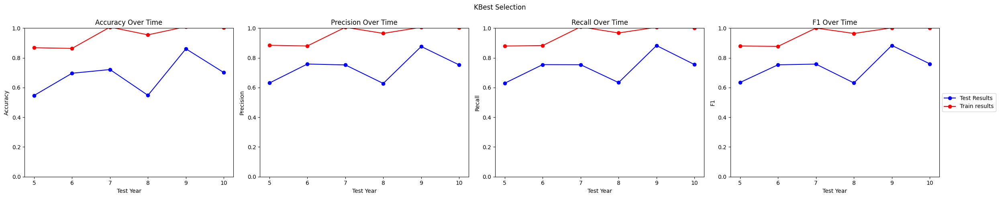

KBest Selection
Accuracy: 0.67, Precision: 0.73, Recall: 0.73, F1: 0.73
10 year
Accuracy: 0.6923076923076923, Precision: 0.75, Recall: 0.75, F1: 0.75


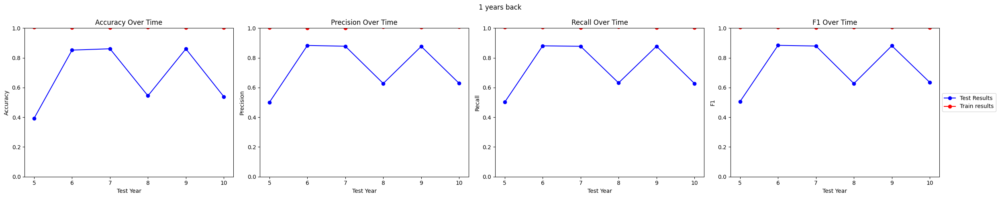

1 years back
Accuracy: 0.67, Precision: 0.73, Recall: 0.73, F1: 0.73
10 year
Accuracy: 0.5384615384615384, Precision: 0.625, Recall: 0.625, F1: 0.625


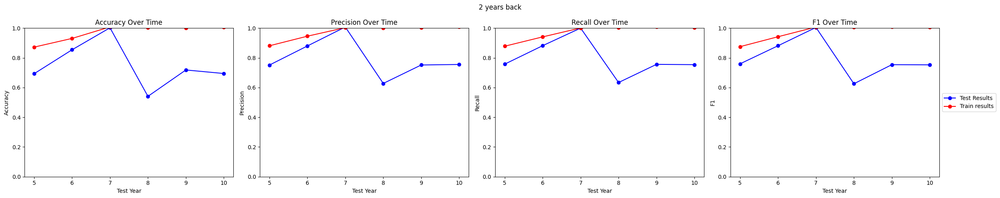

2 years back
Accuracy: 0.75, Precision: 0.79, Recall: 0.79, F1: 0.79
10 year
Accuracy: 0.6923076923076923, Precision: 0.75, Recall: 0.75, F1: 0.75


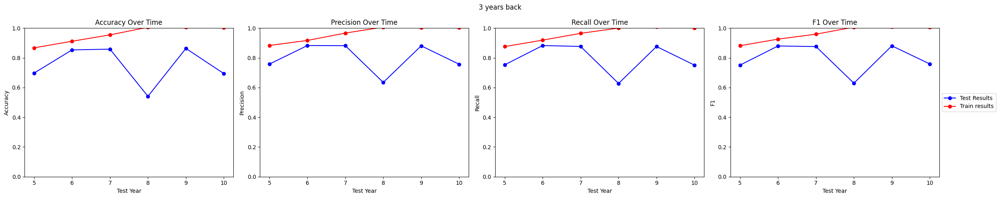

3 years back
Accuracy: 0.75, Precision: 0.79, Recall: 0.79, F1: 0.79
10 year
Accuracy: 0.6923076923076923, Precision: 0.75, Recall: 0.75, F1: 0.75


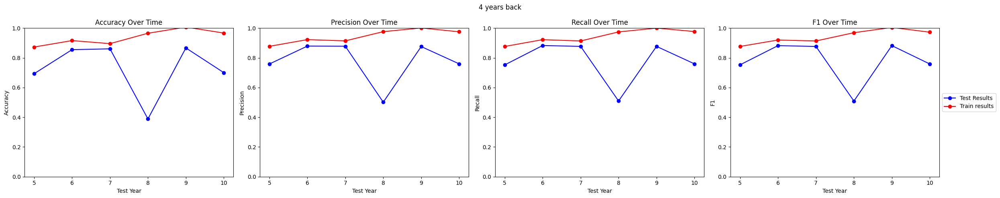

4 years back
Accuracy: 0.72, Precision: 0.77, Recall: 0.77, F1: 0.77
10 year
Accuracy: 0.6923076923076923, Precision: 0.75, Recall: 0.75, F1: 0.75


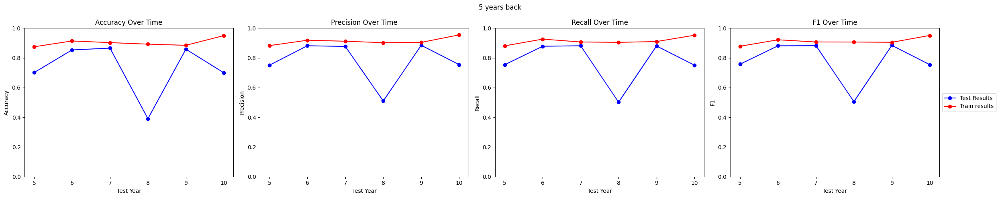

5 years back
Accuracy: 0.72, Precision: 0.77, Recall: 0.77, F1: 0.77
10 year
Accuracy: 0.6923076923076923, Precision: 0.75, Recall: 0.75, F1: 0.75


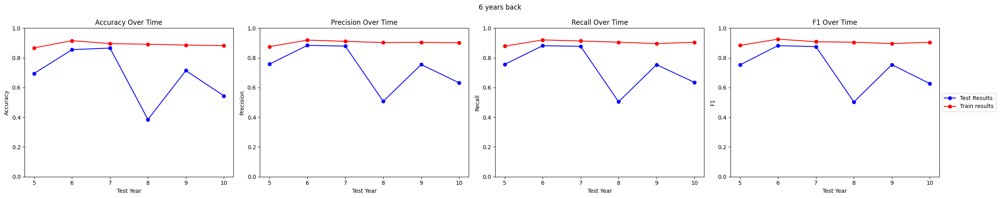

6 years back
Accuracy: 0.67, Precision: 0.73, Recall: 0.73, F1: 0.73
10 year
Accuracy: 0.5384615384615384, Precision: 0.625, Recall: 0.625, F1: 0.625


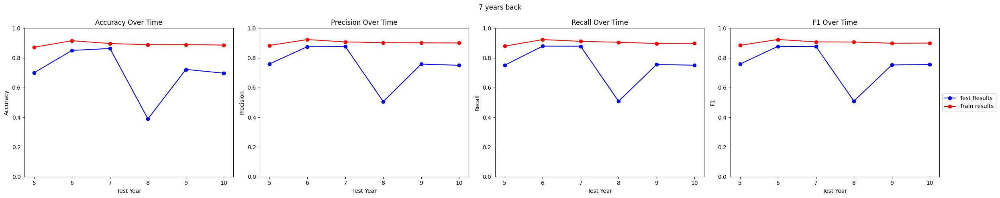

7 years back
Accuracy: 0.70, Precision: 0.75, Recall: 0.75, F1: 0.75
10 year
Accuracy: 0.6923076923076923, Precision: 0.75, Recall: 0.75, F1: 0.75


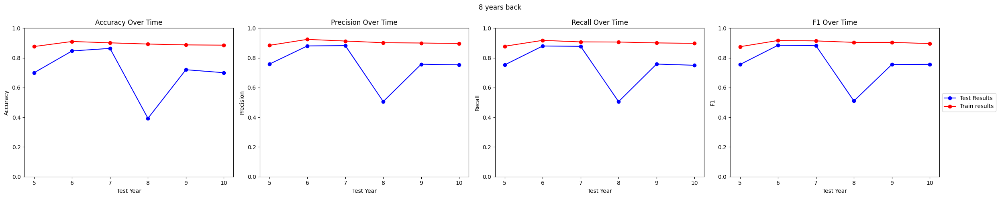

8 years back
Accuracy: 0.70, Precision: 0.75, Recall: 0.75, F1: 0.75
10 year
Accuracy: 0.6923076923076923, Precision: 0.75, Recall: 0.75, F1: 0.75


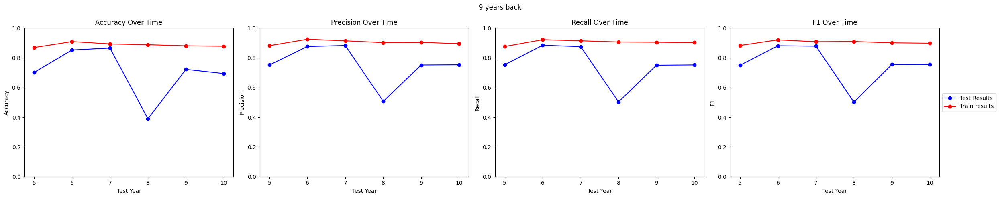

9 years back
Accuracy: 0.70, Precision: 0.75, Recall: 0.75, F1: 0.75
10 year
Accuracy: 0.6923076923076923, Precision: 0.75, Recall: 0.75, F1: 0.75


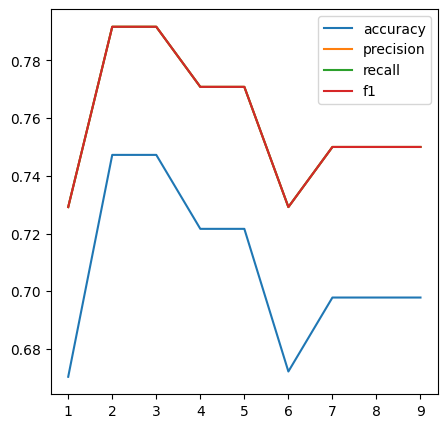

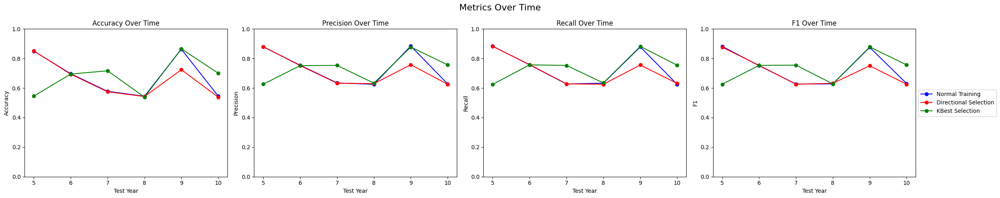

Normal Training
Accuracy: 0.67, Precision: 0.73, Recall: 0.73, F1: 0.73
10 year
Accuracy: 0.5384615384615384, Precision: 0.625, Recall: 0.625, F1: 0.625
Directional Selection
Accuracy: 0.65, Precision: 0.71, Recall: 0.71, F1: 0.71
10 year
Accuracy: 0.5384615384615384, Precision: 0.625, Recall: 0.625, F1: 0.625
KBest Selection
Accuracy: 0.67, Precision: 0.73, Recall: 0.73, F1: 0.73
10 year
Accuracy: 0.6923076923076923, Precision: 0.75, Recall: 0.75, F1: 0.75


In [27]:
model =LogisticRegression()

features = backwards_elimination(df_teams, model, scaling=True)
print(features)
features_kbest = select_k_best(df_teams, model, scaling=True)
print(features_kbest)
years_tested, accuracy_scores, precision_scores, recall_scores, f1_scores = train_evaluate_decision_tree_graph_old(model, df_teams, scaling=True, title="Normal Training")
years_tested, bidirectional_accuracy_scores, bidirectional_precision_scores, bidirectional_recall_scores, bidirectional_f1_scores = train_evaluate_decision_tree_graph_old(model, df_teams[features], scaling=True, title="Bidirectional Selection")
years_tested, kbest_accuracy_scores, kbest_precision_scores, kbest_recall_scores, kbest_f1_scores = train_evaluate_decision_tree_graph_old(model, df_teams[features_kbest], scaling=True, title="KBest Selection")
train_evaluate_decision_tree_years_back(model, df_teams, scaling=True)
plot_metrics_over_time_three(years_tested, accuracy_scores, precision_scores, recall_scores, f1_scores, bidirectional_accuracy_scores, bidirectional_precision_scores, bidirectional_recall_scores, bidirectional_f1_scores, kbest_accuracy_scores, kbest_precision_scores, kbest_recall_scores, kbest_f1_scores)

### MPL

#### Hyperparameter tuning

In [28]:

# model = MLPClassifier()
# param_grid = {
#     'hidden_layer_sizes': [(10,30,10),(20,), (50, 50), (100, 100), (100, 50, 25)],
#     'activation': ['tanh', 'relu', 'logistic', 'identity'],
#     'solver': ['sgd', 'adam', 'lbfgs'],
#     'alpha': [0.0001, 0.001, 0.01],
#     'learning_rate': ['constant','adaptive'],
# }
# grid = GridSearchCV(model, param_grid, cv=None)
# scaler=MinMaxScaler()
# X = scaler.fit_transform(df_teams.drop(columns=['playoff']))
# X = pd.DataFrame(X, columns=df_teams.drop(columns=['playoff']).columns)
# y = df_teams['playoff']
# grid.fit(X, y)
# print(grid.best_estimator_, grid.best_score_)

# MLPClassifier(activation='tanh', hidden_layer_sizes=(10, 30, 10),
#               learning_rate='adaptive', solver='lbfgs')


C:\Users\jigs2\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\sklearn\neural_network\_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


['year', 'rank', 'confW', 'attend', 'total_first_round_lost', 'total_semis_lost', 'total_finals_lost', 'confID_EA', 'confID_WE', 'GP', 'GS', 'minutes', 'PostDQ', 'height', 'weight', 'award_count_x', 'won', 'lost', 'post_wins', 'award_count_y', 'performance', 'points_precision', 'Postpoints_precision', 'tmID_CHI', 'tmID_CLE', 'tmID_HOU', 'tmID_MIN', 'tmID_NYL', 'tmID_PHO', 'tmID_SAC', 'tmID_SAS', 'tmID_WAS', 'playoff', 'tmID_ATL', 'tmID_CHA', 'tmID_CON', 'tmID_DET', 'tmID_IND', 'tmID_LAS', 'tmID_MIA', 'tmID_ORL', 'tmID_POR', 'tmID_SEA', 'tmID_UTA']


C:\Users\jigs2\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\sklearn\neural_network\_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
C:\Users\jigs2\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\sklearn\neural_network\_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
C:\Users\jigs2\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\sklearn\neural_network\_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
C:\Users\jigs2\A

hightest_accuracy_score:  0.7454212454212454


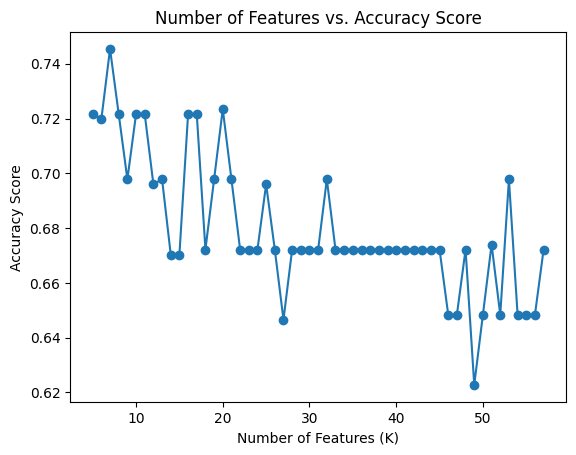

Index(['total_first_round_won', 'total_semis_won', 'minutes', 'performance',
       'Postperformance', 'points_precision', 'Postpoints_precision',
       'playoff', 'year', 'confID_EA', 'confID_WE', 'tmID_ATL', 'tmID_CHA',
       'tmID_CHI', 'tmID_CLE', 'tmID_CON', 'tmID_DET', 'tmID_HOU', 'tmID_IND',
       'tmID_LAS', 'tmID_MIA', 'tmID_MIN', 'tmID_NYL', 'tmID_ORL', 'tmID_PHO',
       'tmID_POR', 'tmID_SAC', 'tmID_SAS', 'tmID_SEA', 'tmID_UTA', 'tmID_WAS'],
      dtype='object')


C:\Users\jigs2\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\sklearn\neural_network\_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
C:\Users\jigs2\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\sklearn\neural_network\_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
C:\Users\jigs2\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\sklearn\neural_network\_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
C:\Users\jigs2\A

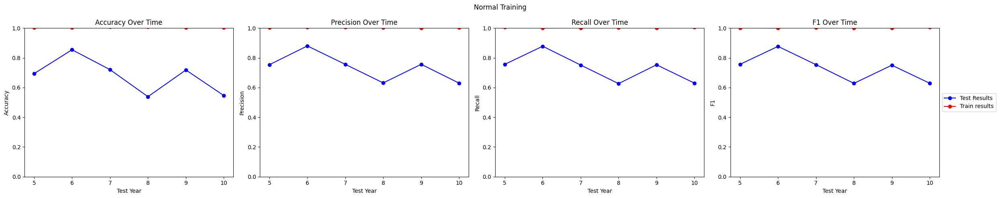

Normal Training
Accuracy: 0.67, Precision: 0.73, Recall: 0.73, F1: 0.73
10 year
Accuracy: 0.5384615384615384, Precision: 0.625, Recall: 0.625, F1: 0.625


C:\Users\jigs2\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\sklearn\neural_network\_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
C:\Users\jigs2\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\sklearn\neural_network\_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
C:\Users\jigs2\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\sklearn\neural_network\_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
C:\Users\jigs2\A

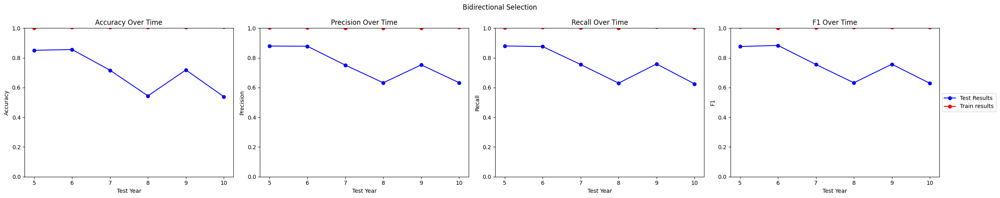

Bidirectional Selection
Accuracy: 0.70, Precision: 0.75, Recall: 0.75, F1: 0.75
10 year
Accuracy: 0.5384615384615384, Precision: 0.625, Recall: 0.625, F1: 0.625


C:\Users\jigs2\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\sklearn\neural_network\_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
C:\Users\jigs2\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\sklearn\neural_network\_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
C:\Users\jigs2\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\sklearn\neural_network\_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
C:\Users\jigs2\A

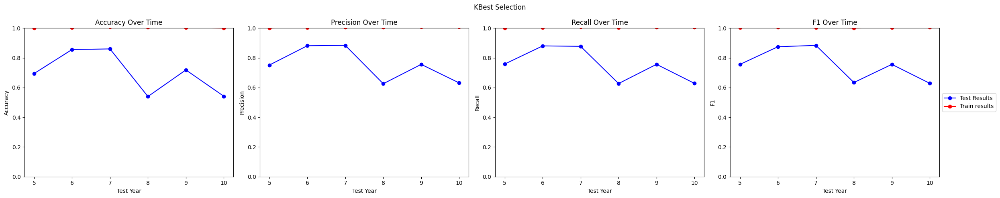

KBest Selection
Accuracy: 0.70, Precision: 0.75, Recall: 0.75, F1: 0.75
10 year
Accuracy: 0.5384615384615384, Precision: 0.625, Recall: 0.625, F1: 0.625


C:\Users\jigs2\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\sklearn\neural_network\_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
C:\Users\jigs2\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\sklearn\neural_network\_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
C:\Users\jigs2\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\sklearn\neural_network\_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
C:\Users\jigs2\A

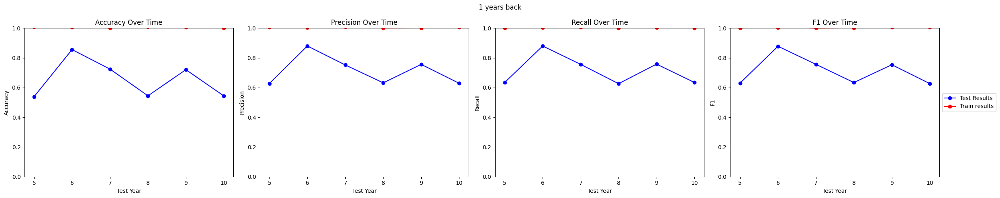

1 years back
Accuracy: 0.65, Precision: 0.71, Recall: 0.71, F1: 0.71
10 year
Accuracy: 0.5384615384615384, Precision: 0.625, Recall: 0.625, F1: 0.625


C:\Users\jigs2\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\sklearn\neural_network\_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
C:\Users\jigs2\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\sklearn\neural_network\_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
C:\Users\jigs2\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\sklearn\neural_network\_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
C:\Users\jigs2\A

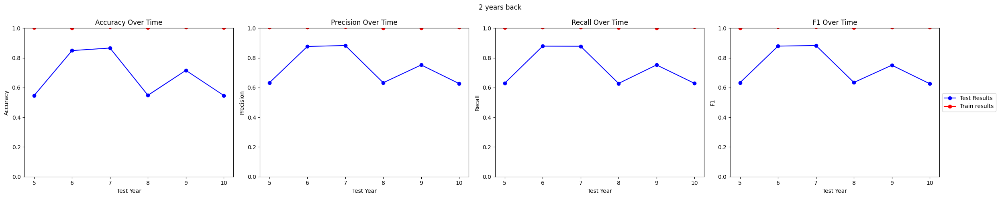

2 years back
Accuracy: 0.67, Precision: 0.73, Recall: 0.73, F1: 0.73
10 year
Accuracy: 0.5384615384615384, Precision: 0.625, Recall: 0.625, F1: 0.625


C:\Users\jigs2\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\sklearn\neural_network\_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
C:\Users\jigs2\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\sklearn\neural_network\_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
C:\Users\jigs2\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\sklearn\neural_network\_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
C:\Users\jigs2\A

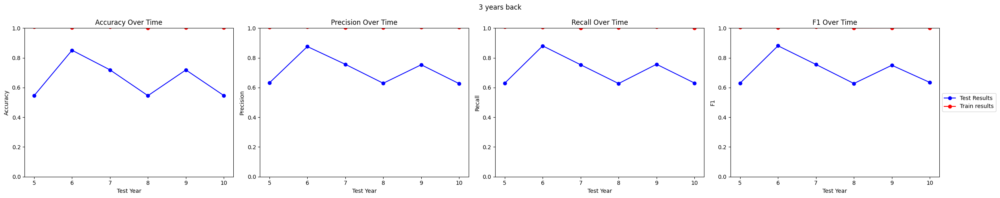

3 years back
Accuracy: 0.65, Precision: 0.71, Recall: 0.71, F1: 0.71
10 year
Accuracy: 0.5384615384615384, Precision: 0.625, Recall: 0.625, F1: 0.625


C:\Users\jigs2\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\sklearn\neural_network\_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
C:\Users\jigs2\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\sklearn\neural_network\_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
C:\Users\jigs2\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\sklearn\neural_network\_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
C:\Users\jigs2\A

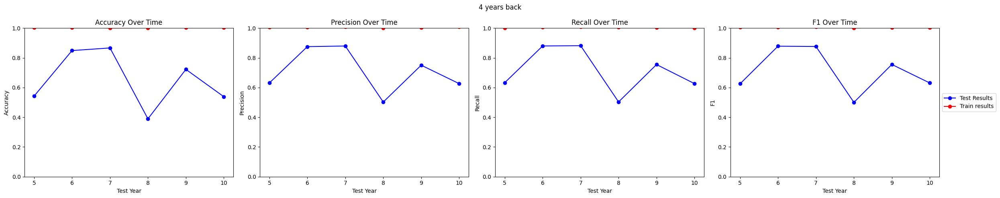

4 years back
Accuracy: 0.65, Precision: 0.71, Recall: 0.71, F1: 0.71
10 year
Accuracy: 0.5384615384615384, Precision: 0.625, Recall: 0.625, F1: 0.625


C:\Users\jigs2\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\sklearn\neural_network\_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
C:\Users\jigs2\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\sklearn\neural_network\_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
C:\Users\jigs2\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\sklearn\neural_network\_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
C:\Users\jigs2\A

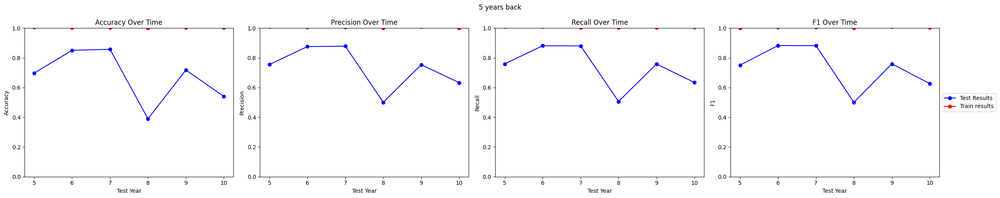

5 years back
Accuracy: 0.67, Precision: 0.73, Recall: 0.73, F1: 0.73
10 year
Accuracy: 0.5384615384615384, Precision: 0.625, Recall: 0.625, F1: 0.625


C:\Users\jigs2\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\sklearn\neural_network\_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
C:\Users\jigs2\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\sklearn\neural_network\_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
C:\Users\jigs2\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\sklearn\neural_network\_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
C:\Users\jigs2\A

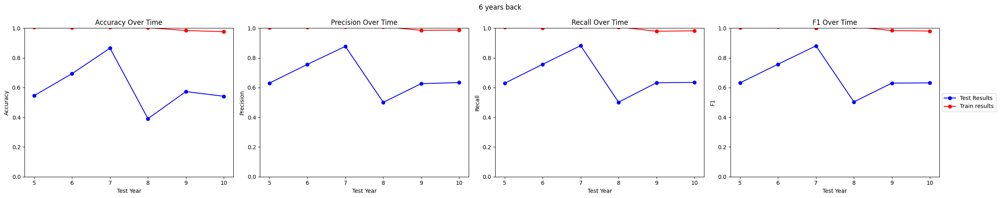

6 years back
Accuracy: 0.60, Precision: 0.67, Recall: 0.67, F1: 0.67
10 year
Accuracy: 0.5384615384615384, Precision: 0.625, Recall: 0.625, F1: 0.625


C:\Users\jigs2\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\sklearn\neural_network\_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
C:\Users\jigs2\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\sklearn\neural_network\_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
C:\Users\jigs2\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\sklearn\neural_network\_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
C:\Users\jigs2\A

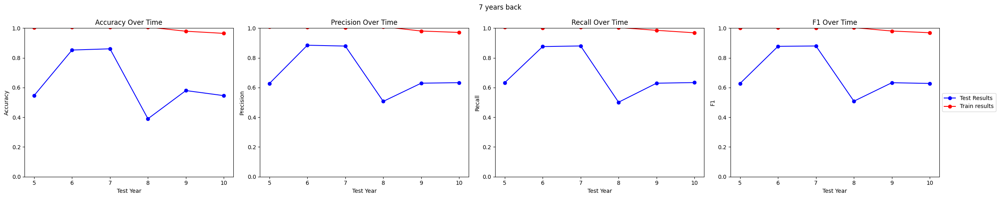

7 years back
Accuracy: 0.62, Precision: 0.69, Recall: 0.69, F1: 0.69
10 year
Accuracy: 0.5384615384615384, Precision: 0.625, Recall: 0.625, F1: 0.625


C:\Users\jigs2\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\sklearn\neural_network\_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
C:\Users\jigs2\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\sklearn\neural_network\_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
C:\Users\jigs2\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\sklearn\neural_network\_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
C:\Users\jigs2\A

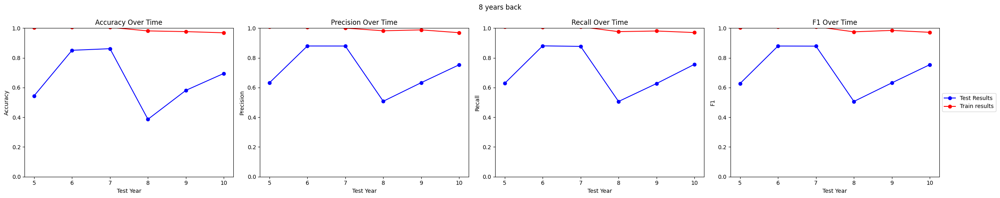

8 years back
Accuracy: 0.65, Precision: 0.71, Recall: 0.71, F1: 0.71
10 year
Accuracy: 0.6923076923076923, Precision: 0.75, Recall: 0.75, F1: 0.75


C:\Users\jigs2\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\sklearn\neural_network\_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
C:\Users\jigs2\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\sklearn\neural_network\_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
C:\Users\jigs2\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\sklearn\neural_network\_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
C:\Users\jigs2\A

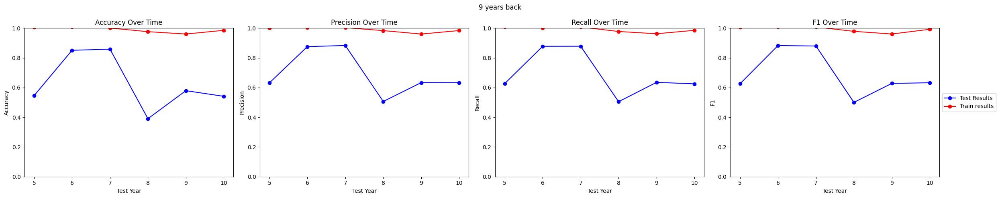

9 years back
Accuracy: 0.62, Precision: 0.69, Recall: 0.69, F1: 0.69
10 year
Accuracy: 0.5384615384615384, Precision: 0.625, Recall: 0.625, F1: 0.625


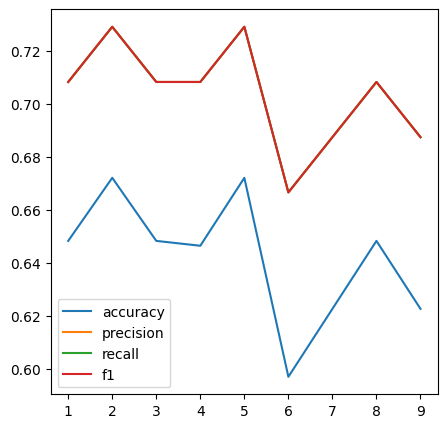

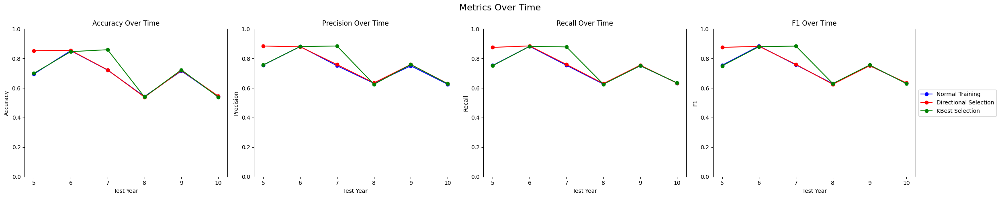

Normal Training
Accuracy: 0.67, Precision: 0.73, Recall: 0.73, F1: 0.73
10 year
Accuracy: 0.5384615384615384, Precision: 0.625, Recall: 0.625, F1: 0.625
Directional Selection
Accuracy: 0.70, Precision: 0.75, Recall: 0.75, F1: 0.75
10 year
Accuracy: 0.5384615384615384, Precision: 0.625, Recall: 0.625, F1: 0.625
KBest Selection
Accuracy: 0.70, Precision: 0.75, Recall: 0.75, F1: 0.75
10 year
Accuracy: 0.5384615384615384, Precision: 0.625, Recall: 0.625, F1: 0.625


In [29]:
model =   MLPClassifier()

features = backwards_elimination(df_teams, model, scaling=True)
print(features)
features_kbest = select_k_best(df_teams, model, scaling=True)
print(features_kbest)
years_tested, accuracy_scores, precision_scores, recall_scores, f1_scores = train_evaluate_decision_tree_graph_old(model, df_teams, scaling=True, title="Normal Training")
years_tested, bidirectional_accuracy_scores, bidirectional_precision_scores, bidirectional_recall_scores, bidirectional_f1_scores = train_evaluate_decision_tree_graph_old(model, df_teams[features], scaling=True, title="Bidirectional Selection")
years_tested, kbest_accuracy_scores, kbest_precision_scores, kbest_recall_scores, kbest_f1_scores = train_evaluate_decision_tree_graph_old(model, df_teams[features_kbest], scaling=True, title="KBest Selection")
train_evaluate_decision_tree_years_back(model, df_teams, scaling=True)
plot_metrics_over_time_three(years_tested, accuracy_scores, precision_scores, recall_scores, f1_scores, bidirectional_accuracy_scores, bidirectional_precision_scores, bidirectional_recall_scores, bidirectional_f1_scores, kbest_accuracy_scores, kbest_precision_scores, kbest_recall_scores, kbest_f1_scores)


### lightgbm

#### Hyperparameter tuning

In [30]:
# import lightgbm as lgb
# model = lgb.LGBMClassifier()
# param_grid = { 'n_estimators': [100, 200, 300],
#     'learning_rate': [0.01, 0.1, 0.2],
#     'max_depth': [5, 10, 15],
#     'num_leaves': [8, 16, 31, 63, 127],
#     'n_estimators': [50, 100, 200, 300],
#     'boosting_type' : ['gbdt', 'dart'], # for better accuracy -> try dart
# }
# grid = GridSearchCV(model, param_grid, cv=None)
# X = df_teams.drop(columns=['playoff'])
# y = df_teams['playoff']
# grid.fit(X, y)
# print(grid.best_estimator_, grid.best_score_)
# LGBMClassifier(learning_rate=0.01, max_depth=5, num_leaves=8) 0.8898461538461537


[LightGBM] [Info] Number of positive: 64, number of negative: 46
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000056 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 742
[LightGBM] [Info] Number of data points in the train set: 110, number of used features: 34
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.581818 -> initscore=0.330242
[LightGBM] [Info] Start training from score 0.330242
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[Li

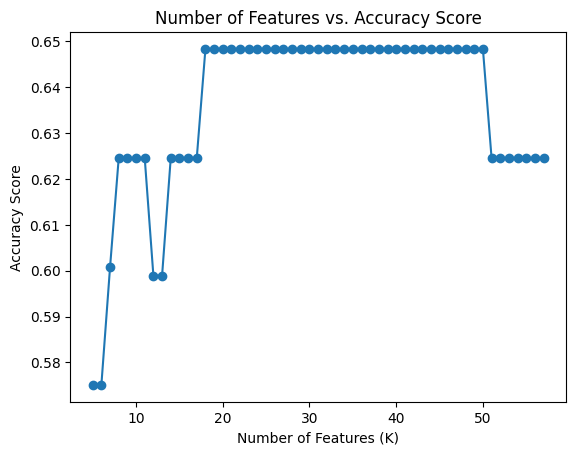

Index(['confW', 'num_playoff_appearances', 'total_first_round_won',
       'total_semis_won', 'total_finals_won', 'mean_won', 'GS', 'minutes',
       'PostGP', 'PostGS', 'PostMinutes', 'award_count_x', 'won', 'post_wins',
       'performance', 'Postperformance', 'points_precision',
       'Postpoints_precision', 'playoff', 'year', 'confID_EA', 'confID_WE',
       'tmID_ATL', 'tmID_CHA', 'tmID_CHI', 'tmID_CLE', 'tmID_CON', 'tmID_DET',
       'tmID_HOU', 'tmID_IND', 'tmID_LAS', 'tmID_MIA', 'tmID_MIN', 'tmID_NYL',
       'tmID_ORL', 'tmID_PHO', 'tmID_POR', 'tmID_SAC', 'tmID_SAS', 'tmID_SEA',
       'tmID_UTA', 'tmID_WAS'],
      dtype='object')
[LightGBM] [Warning] There are no meaningful features which satisfy the provided configuration. Decreasing Dataset parameters min_data_in_bin or min_data_in_leaf and re-constructing Dataset might resolve this warning.
[LightGBM] [Info] Number of positive: 8, number of negative: 7
[LightGBM] [Info] Total Bins 0
[LightGBM] [Info] Number of data point

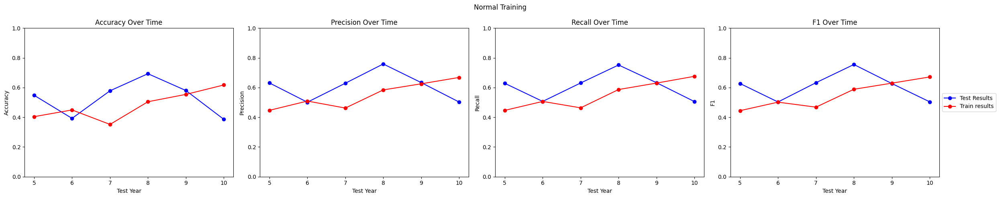

Normal Training
Accuracy: 0.52, Precision: 0.60, Recall: 0.60, F1: 0.60
10 year
Accuracy: 0.38461538461538464, Precision: 0.5, Recall: 0.5, F1: 0.5
[LightGBM] [Warning] There are no meaningful features which satisfy the provided configuration. Decreasing Dataset parameters min_data_in_bin or min_data_in_leaf and re-constructing Dataset might resolve this warning.
[LightGBM] [Info] Number of positive: 8, number of negative: 7
[LightGBM] [Info] Total Bins 0
[LightGBM] [Info] Number of data points in the train set: 15, number of used features: 0
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.533333 -> initscore=0.133531
[LightGBM] [Info] Start training from score 0.133531
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightG

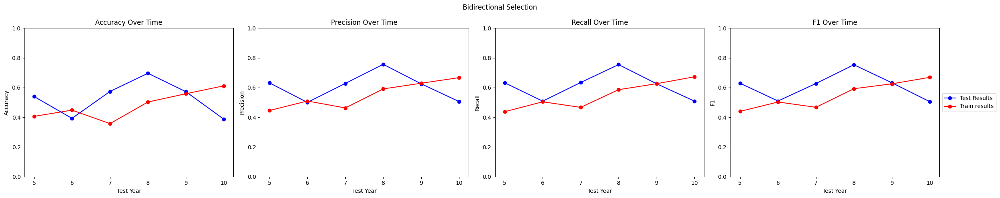

Bidirectional Selection
Accuracy: 0.52, Precision: 0.60, Recall: 0.60, F1: 0.60
10 year
Accuracy: 0.38461538461538464, Precision: 0.5, Recall: 0.5, F1: 0.5
[LightGBM] [Warning] There are no meaningful features which satisfy the provided configuration. Decreasing Dataset parameters min_data_in_bin or min_data_in_leaf and re-constructing Dataset might resolve this warning.
[LightGBM] [Info] Number of positive: 8, number of negative: 7
[LightGBM] [Info] Total Bins 0
[LightGBM] [Info] Number of data points in the train set: 15, number of used features: 0
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.533333 -> initscore=0.133531
[LightGBM] [Info] Start training from score 0.133531
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements

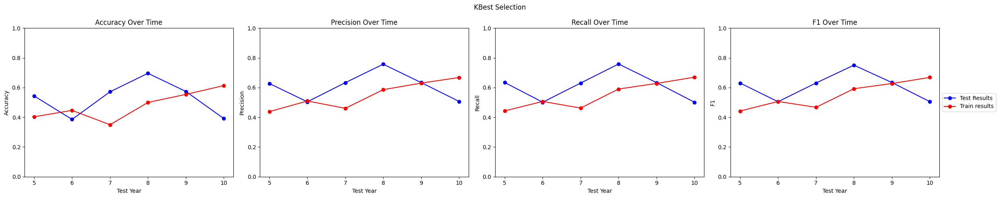

KBest Selection
Accuracy: 0.52, Precision: 0.60, Recall: 0.60, F1: 0.60
10 year
Accuracy: 0.38461538461538464, Precision: 0.5, Recall: 0.5, F1: 0.5
[LightGBM] [Warning] There are no meaningful features which satisfy the provided configuration. Decreasing Dataset parameters min_data_in_bin or min_data_in_leaf and re-constructing Dataset might resolve this warning.
[LightGBM] [Info] Number of positive: 8, number of negative: 6
[LightGBM] [Info] Total Bins 0
[LightGBM] [Info] Number of data points in the train set: 14, number of used features: 0
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.571429 -> initscore=0.287682
[LightGBM] [Info] Start training from score 0.287682
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightG

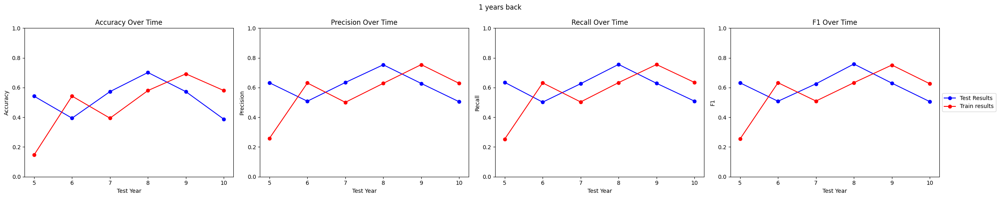

1 years back
Accuracy: 0.52, Precision: 0.60, Recall: 0.60, F1: 0.60
10 year
Accuracy: 0.38461538461538464, Precision: 0.5, Recall: 0.5, F1: 0.5
[LightGBM] [Warning] There are no meaningful features which satisfy the provided configuration. Decreasing Dataset parameters min_data_in_bin or min_data_in_leaf and re-constructing Dataset might resolve this warning.
[LightGBM] [Info] Number of positive: 16, number of negative: 14
[LightGBM] [Info] Total Bins 0
[LightGBM] [Info] Number of data points in the train set: 30, number of used features: 0
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.533333 -> initscore=0.133531
[LightGBM] [Info] Start training from score 0.133531
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGB

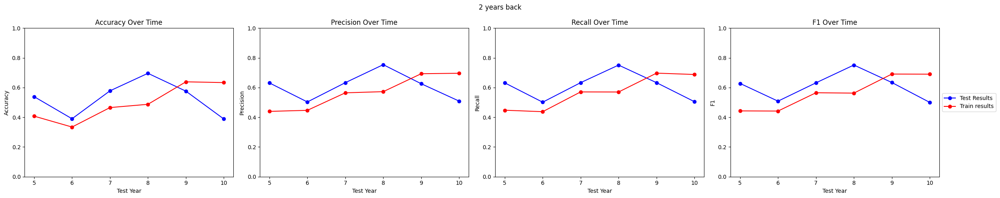

2 years back
Accuracy: 0.52, Precision: 0.60, Recall: 0.60, F1: 0.60
10 year
Accuracy: 0.38461538461538464, Precision: 0.5, Recall: 0.5, F1: 0.5
[LightGBM] [Warning] There are no meaningful features which satisfy the provided configuration. Decreasing Dataset parameters min_data_in_bin or min_data_in_leaf and re-constructing Dataset might resolve this warning.
[LightGBM] [Info] Number of positive: 16, number of negative: 14
[LightGBM] [Info] Total Bins 0
[LightGBM] [Info] Number of data points in the train set: 30, number of used features: 0
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.533333 -> initscore=0.133531
[LightGBM] [Info] Start training from score 0.133531
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGB

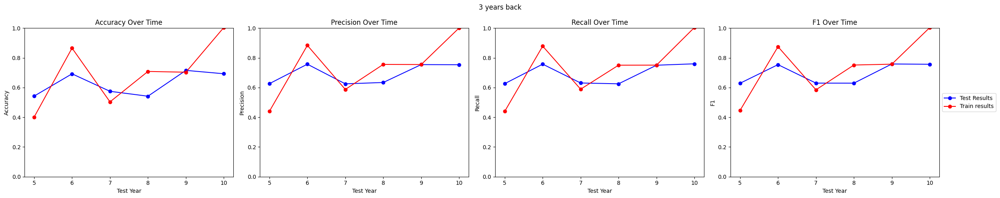

3 years back
Accuracy: 0.62, Precision: 0.69, Recall: 0.69, F1: 0.69
10 year
Accuracy: 0.6923076923076923, Precision: 0.75, Recall: 0.75, F1: 0.75
[LightGBM] [Warning] There are no meaningful features which satisfy the provided configuration. Decreasing Dataset parameters min_data_in_bin or min_data_in_leaf and re-constructing Dataset might resolve this warning.
[LightGBM] [Info] Number of positive: 16, number of negative: 14
[LightGBM] [Info] Total Bins 0
[LightGBM] [Info] Number of data points in the train set: 30, number of used features: 0
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.533333 -> initscore=0.133531
[LightGBM] [Info] Start training from score 0.133531
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[Light

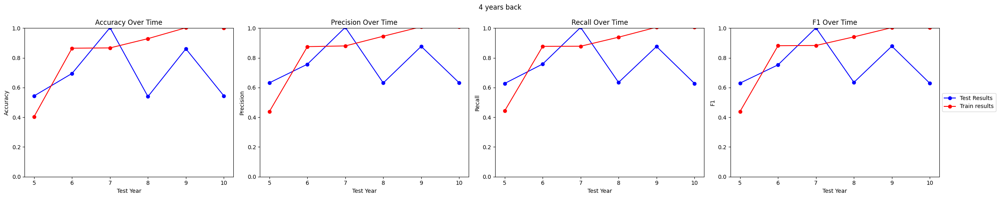

4 years back
Accuracy: 0.69, Precision: 0.75, Recall: 0.75, F1: 0.75
10 year
Accuracy: 0.5384615384615384, Precision: 0.625, Recall: 0.625, F1: 0.625
[LightGBM] [Warning] There are no meaningful features which satisfy the provided configuration. Decreasing Dataset parameters min_data_in_bin or min_data_in_leaf and re-constructing Dataset might resolve this warning.
[LightGBM] [Info] Number of positive: 16, number of negative: 14
[LightGBM] [Info] Total Bins 0
[LightGBM] [Info] Number of data points in the train set: 30, number of used features: 0
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.533333 -> initscore=0.133531
[LightGBM] [Info] Start training from score 0.133531
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[Li

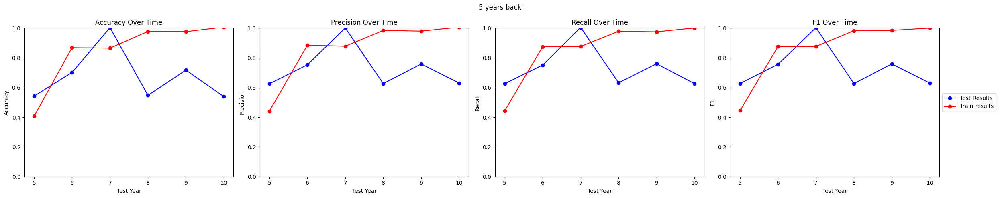

5 years back
Accuracy: 0.67, Precision: 0.73, Recall: 0.73, F1: 0.73
10 year
Accuracy: 0.5384615384615384, Precision: 0.625, Recall: 0.625, F1: 0.625
[LightGBM] [Warning] There are no meaningful features which satisfy the provided configuration. Decreasing Dataset parameters min_data_in_bin or min_data_in_leaf and re-constructing Dataset might resolve this warning.
[LightGBM] [Info] Number of positive: 16, number of negative: 14
[LightGBM] [Info] Total Bins 0
[LightGBM] [Info] Number of data points in the train set: 30, number of used features: 0
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.533333 -> initscore=0.133531
[LightGBM] [Info] Start training from score 0.133531
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[Li

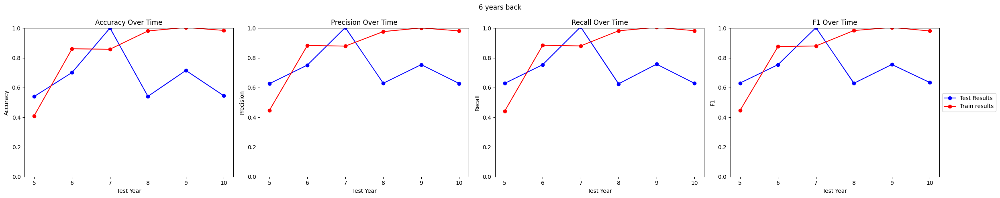

6 years back
Accuracy: 0.67, Precision: 0.73, Recall: 0.73, F1: 0.73
10 year
Accuracy: 0.5384615384615384, Precision: 0.625, Recall: 0.625, F1: 0.625
[LightGBM] [Warning] There are no meaningful features which satisfy the provided configuration. Decreasing Dataset parameters min_data_in_bin or min_data_in_leaf and re-constructing Dataset might resolve this warning.
[LightGBM] [Info] Number of positive: 16, number of negative: 14
[LightGBM] [Info] Total Bins 0
[LightGBM] [Info] Number of data points in the train set: 30, number of used features: 0
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.533333 -> initscore=0.133531
[LightGBM] [Info] Start training from score 0.133531
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[Li

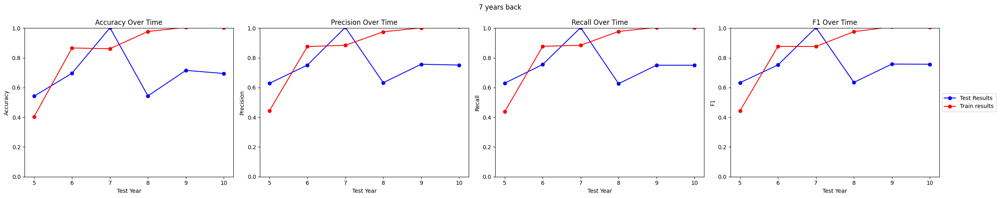

7 years back
Accuracy: 0.70, Precision: 0.75, Recall: 0.75, F1: 0.75
10 year
Accuracy: 0.6923076923076923, Precision: 0.75, Recall: 0.75, F1: 0.75
[LightGBM] [Warning] There are no meaningful features which satisfy the provided configuration. Decreasing Dataset parameters min_data_in_bin or min_data_in_leaf and re-constructing Dataset might resolve this warning.
[LightGBM] [Info] Number of positive: 16, number of negative: 14
[LightGBM] [Info] Total Bins 0
[LightGBM] [Info] Number of data points in the train set: 30, number of used features: 0
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.533333 -> initscore=0.133531
[LightGBM] [Info] Start training from score 0.133531
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[Light

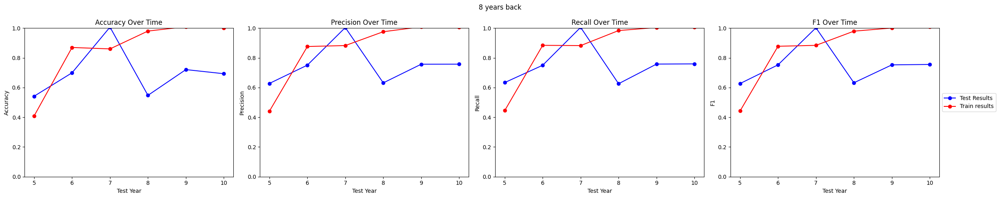

8 years back
Accuracy: 0.70, Precision: 0.75, Recall: 0.75, F1: 0.75
10 year
Accuracy: 0.6923076923076923, Precision: 0.75, Recall: 0.75, F1: 0.75
[LightGBM] [Warning] There are no meaningful features which satisfy the provided configuration. Decreasing Dataset parameters min_data_in_bin or min_data_in_leaf and re-constructing Dataset might resolve this warning.
[LightGBM] [Info] Number of positive: 16, number of negative: 14
[LightGBM] [Info] Total Bins 0
[LightGBM] [Info] Number of data points in the train set: 30, number of used features: 0
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.533333 -> initscore=0.133531
[LightGBM] [Info] Start training from score 0.133531
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[Light

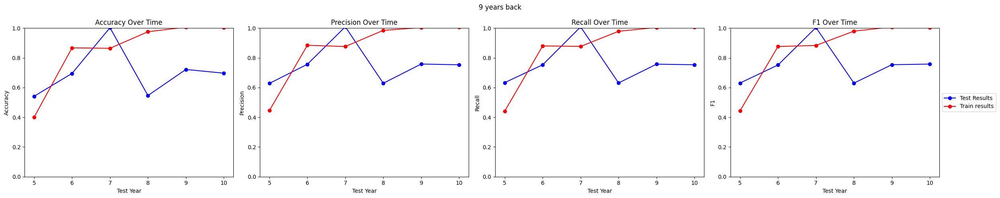

9 years back
Accuracy: 0.70, Precision: 0.75, Recall: 0.75, F1: 0.75
10 year
Accuracy: 0.6923076923076923, Precision: 0.75, Recall: 0.75, F1: 0.75


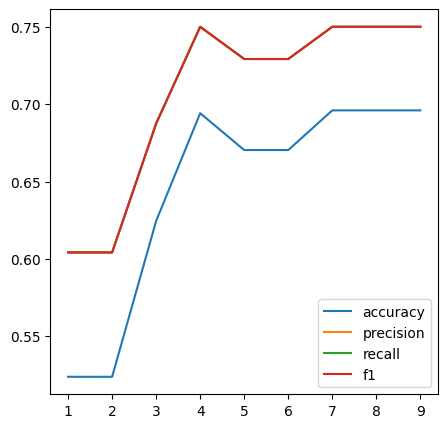

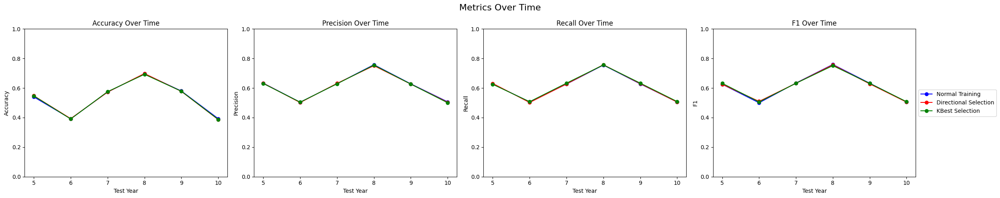

Normal Training
Accuracy: 0.52, Precision: 0.60, Recall: 0.60, F1: 0.60
10 year
Accuracy: 0.38461538461538464, Precision: 0.5, Recall: 0.5, F1: 0.5
Directional Selection
Accuracy: 0.52, Precision: 0.60, Recall: 0.60, F1: 0.60
10 year
Accuracy: 0.38461538461538464, Precision: 0.5, Recall: 0.5, F1: 0.5
KBest Selection
Accuracy: 0.52, Precision: 0.60, Recall: 0.60, F1: 0.60
10 year
Accuracy: 0.38461538461538464, Precision: 0.5, Recall: 0.5, F1: 0.5


In [31]:
import lightgbm as lgb
model =  lgb.LGBMClassifier()

features = backwards_elimination(df_teams,model)
print(features)
features_kbest = select_k_best(df_teams, model)
print(features_kbest)
years_tested, accuracy_scores, precision_scores, recall_scores, f1_scores = train_evaluate_decision_tree_graph_old(model, df_teams, title="Normal Training")
years_tested, bidirectional_accuracy_scores, bidirectional_precision_scores, bidirectional_recall_scores, bidirectional_f1_scores = train_evaluate_decision_tree_graph_old(model, df_teams[features], title="Bidirectional Selection")
years_tested, kbest_accuracy_scores, kbest_precision_scores, kbest_recall_scores, kbest_f1_scores = train_evaluate_decision_tree_graph_old(model, df_teams[features_kbest], title="KBest Selection")
train_evaluate_decision_tree_years_back(model, df_teams)
plot_metrics_over_time_three(years_tested, accuracy_scores, precision_scores, recall_scores, f1_scores, bidirectional_accuracy_scores, bidirectional_precision_scores, bidirectional_recall_scores, bidirectional_f1_scores, kbest_accuracy_scores, kbest_precision_scores, kbest_recall_scores, kbest_f1_scores)

In [32]:
# from sklearn.linear_model import LogisticRegression
# from sklearn.naive_bayes import GaussianNB

# # First Model
# #features_model1 = backwards_elimination(df_teams, BaggingClassifier(estimator=LogisticRegression(C=0.1, class_weight='balanced'), n_estimators=10, random_state=0), scaling=True)
# model1 = BaggingClassifier(estimator=LogisticRegression(), n_estimators=100, random_state=0)

# # Second Model
# #features_model2 = backwards_elimination(df_teams, BaggingClassifier(estimator=GaussianNB(priors=[0.2, 0.8]), n_estimators=100, random_state=0))
# model2 = BaggingClassifier(estimator=GaussianNB(), n_estimators=100, random_state=0)

# ## Third Model
# #features3 = backwards_elimination(df_teams, BaggingClassifier(estimator=KNeighborsClassifier(leaf_size=5, n_neighbors=10), n_estimators=10, random_state=0), scaling=True)
# #model = BaggingClassifier(estimator=KNeighborsClassifier(leaf_size=5, n_neighbors=10), n_estimators=100, random_state=0)
# model3 = KNeighborsClassifier()

# model4 = BaggingClassifier(estimator= MLPClassifier(activation='identity', alpha=0.01, hidden_layer_sizes=(100, 100),
#               learning_rate='adaptive', solver='sgd',  max_iter=400), n_estimators=10, random_state=0)


In [33]:
# from sklearn.ensemble import BaggingClassifier, VotingClassifier

# # Voting Ensemble
# voting_clf = VotingClassifier(estimators=[
#     ('model1', model1),
#     ('model2', model2),
#     ('model3', model3)
# ], voting='soft')

# # Extract the target variable
# target_variable = df_teams["playoff"]

# # Fit the ensemble model
# voting_clf.fit(df_teams, target_variable)

# features = backwards_elimination(df_teams, voting_clf, scaling=True )
# print(features)
# # Evaluate the ensemble model
# years_tested, accuracy_scores, precision_scores, recall_scores, f1_scores = train_evaluate_decision_tree_graph_old(voting_clf, df_teams, scaling=True)
# years_tested, bidirectional_accuracy_scores, bidirectional_precision_scores, bidirectional_recall_scores, bidirectional_f1_scores = train_evaluate_decision_tree_graph_old(voting_clf, df_teams[features], scaling=True)
# years_tested, kbest_accuracy_scores, kbest_precision_scores, kbest_recall_scores, kbest_f1_scores = train_evaluate_decision_tree_graph_old(voting_clf, df_teams_kbest, scaling=True)
# plot_metrics_over_time_three(years_tested, accuracy_scores, precision_scores, recall_scores, f1_scores, bidirectional_accuracy_scores, bidirectional_precision_scores, bidirectional_recall_scores, bidirectional_f1_scores, kbest_accuracy_scores, kbest_precision_scores, kbest_recall_scores, kbest_f1_scores)

